# Notebook Contents

Streamlined code using user-generated python functions.

In accordance with procedure discussed from 6/4/2024 meeting to 7/16/2024 meeting.

Flood Factors

    1 Up "Minimal"
    3 Up "Moderate"
    5 Up "Major"
    7 Up "Severe"
    9 Up "Extreme"

    Exposure ≡ Weighted FF Sum = 1*(# parcels w/ FF=1) + 2*(# parcels w/ FF=2) + ... + 10*(# parcels w/ FF=10)
    Ascending Sort
    Total, White/Nonwhite
        Other Demographics (Black/Nonblack, etc.) - Depends on regional clustering of demographic
    
    All Coastal States - All Coastal Counties containing 6 or more Census Tracts - Coastal States only considering their Coastal Counties
        Lorenz Curves
        Gini Index Calculation
        Inequality Index Calculation
        Comparison Plots
            Distance Correlation
            y-axis
                Gini, II
            x-axis
                Population Density
                Median Household Income
                Median Household Value
                High School Education
    Scatter plot of FF 1up, 3up, 5up, 7up, and 9up
        y-axis
            Gini index
        x-axis
            State
            Population
    Distance difference between vertical pairs
    Examine second highest demographic in coastal counties (To be completed based on GIS maps)
        Generate plots for "advantaged" demographic
        
To-Do
    
    Graphs of vertical difference with each state as one point
        can be combined into one plot or split for each FF threshold
    Ratio of FFsum9VD/FFsum3VD
        check to see what the ratio comes out as
        understand qualitatively what the ratio means
        difference of white vs. difference of nonwhite
    Potential for temporal aspect looking back to 2000 census data
        assume FF is accurate as risk indicator back to 2000

In [1]:
# Notebook wide packages
import os
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import dcor

In [2]:
# Notebook wide functions
from read import read
from refine import refine
from state_dfs import state_dfs
from county_dfs import county_dfs
from lorenz_curve import lorenz_curve
from state_csvs import state_csvs
from county_csvs import county_csvs
from comparison_plot import comparison_plot

## Coastal States

States (including D.C.) in the contiguous U.S. containing coastal counties according to NOAA Fisheries.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

### White

In [3]:
# dataframe generation
df_coastalstates_FFsum = read('data/tract_all.csv','white','FFsum')
df_coastalstates_FFsum3up = read('data/tract_all.csv','white','FFsum3up')
df_coastalstates_FFsum5up = read('data/tract_all.csv','white','FFsum5up')
df_coastalstates_FFsum7up = read('data/tract_all.csv','white','FFsum7up')
df_coastalstates_FFsum9up = read('data/tract_all.csv','white','FFsum9up')

C:\Users\jade02\Desktop\Research\Analysis\CoastalTract\CoastalTract_Python_WF\lorenz_curve.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(6,6))


''

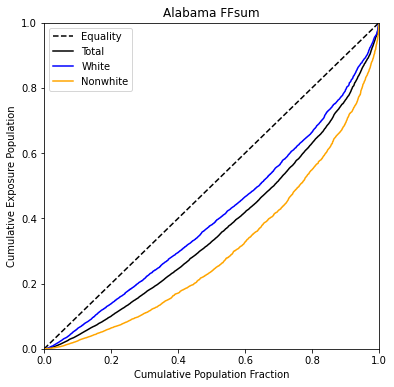

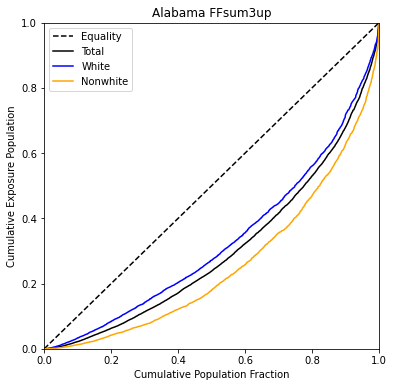

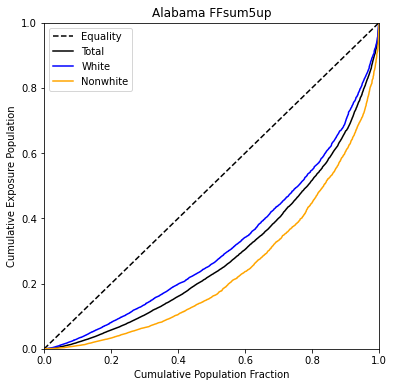

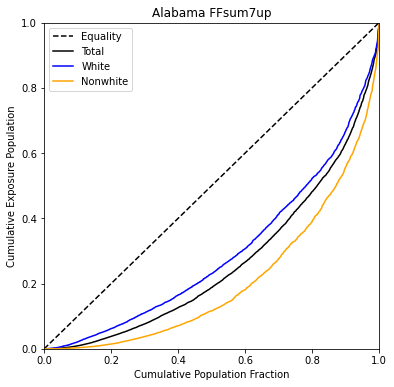

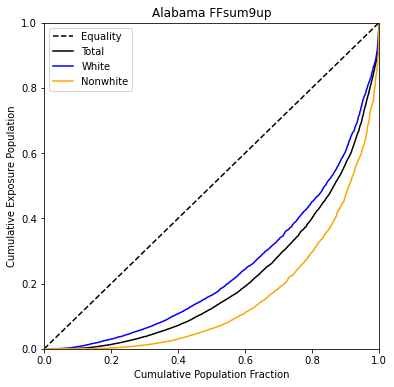

...

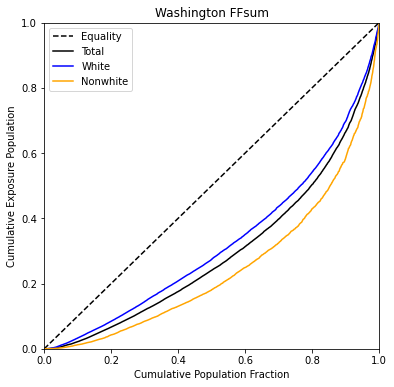

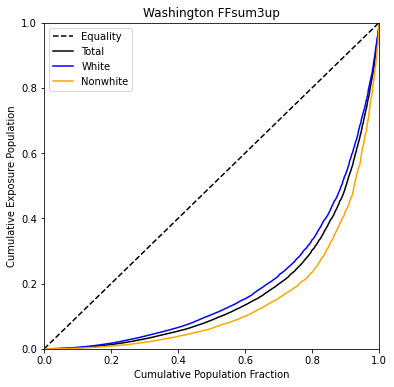

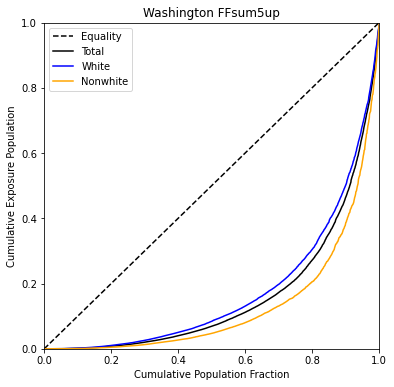

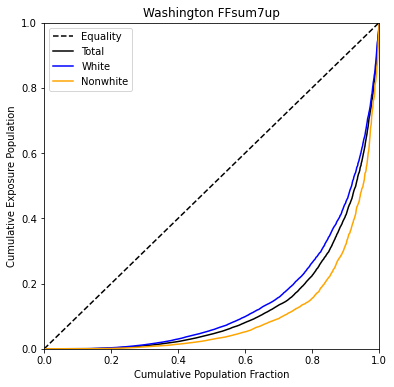

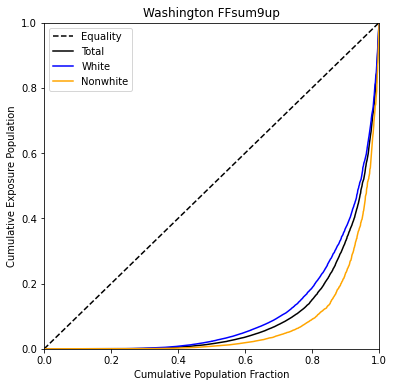

In [4]:
# lorenz curves
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

for i in coastalstates:
    df_coastalstates_FFsum_state = state_dfs(df_coastalstates_FFsum,'white','FFsum',i)
    df_coastalstates_FFsum3up_state = state_dfs(df_coastalstates_FFsum3up,'white','FFsum3up',i)
    df_coastalstates_FFsum5up_state = state_dfs(df_coastalstates_FFsum3up,'white','FFsum5up',i)
    df_coastalstates_FFsum7up_state = state_dfs(df_coastalstates_FFsum3up,'white','FFsum7up',i)
    df_coastalstates_FFsum9up_state = state_dfs(df_coastalstates_FFsum3up,'white','FFsum9up',i)
    
    lorenz_curve(df_coastalstates_FFsum_state[0],df_coastalstates_FFsum_state[1],df_coastalstates_FFsum_state[2],'white','FFsum','CoastalStates',i)
    lorenz_curve(df_coastalstates_FFsum3up_state[0],df_coastalstates_FFsum3up_state[1],df_coastalstates_FFsum3up_state[2],'white','FFsum3up','CoastalStates',i)
    lorenz_curve(df_coastalstates_FFsum5up_state[0],df_coastalstates_FFsum5up_state[1],df_coastalstates_FFsum5up_state[2],'white','FFsum5up','CoastalStates',i)
    lorenz_curve(df_coastalstates_FFsum7up_state[0],df_coastalstates_FFsum7up_state[1],df_coastalstates_FFsum7up_state[2],'white','FFsum7up','CoastalStates',i)
    lorenz_curve(df_coastalstates_FFsum9up_state[0],df_coastalstates_FFsum9up_state[1],df_coastalstates_FFsum9up_state[2],'white','FFsum9up','CoastalStates',i)
;

In [5]:
# csv generation
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

state_csvs(df_coastalstates_FFsum,coastalstates,'white','FFsum','CoastalStates')
state_csvs(df_coastalstates_FFsum3up,coastalstates,'white','FFsum3up','CoastalStates')
state_csvs(df_coastalstates_FFsum5up,coastalstates,'white','FFsum5up','CoastalStates')
state_csvs(df_coastalstates_FFsum7up,coastalstates,'white','FFsum7up','CoastalStates')
state_csvs(df_coastalstates_FFsum9up,coastalstates,'white','FFsum9up','CoastalStates')
;

''

In [20]:
# read csvs
df_coastalstates_FFsum_white_csv = pd.read_csv('results/csvs/CoastalStates/white_FFsum.csv')
df_coastalstates_FFsum3up_white_csv = pd.read_csv('results/csvs/CoastalStates/white_FFsum3up.csv')
df_coastalstates_FFsum5up_white_csv = pd.read_csv('results/csvs/CoastalStates/white_FFsum5up.csv')
df_coastalstates_FFsum7up_white_csv = pd.read_csv('results/csvs/CoastalStates/white_FFsum7up.csv')
df_coastalstates_FFsum9up_white_csv = pd.read_csv('results/csvs/CoastalStates/white_FFsum9up.csv')

''

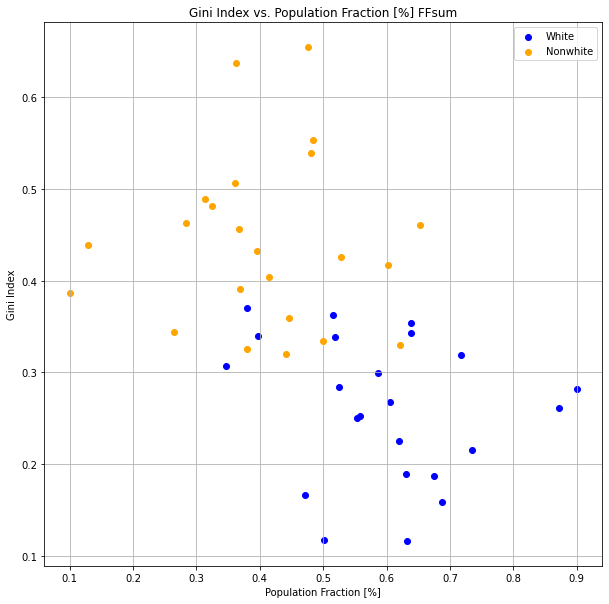

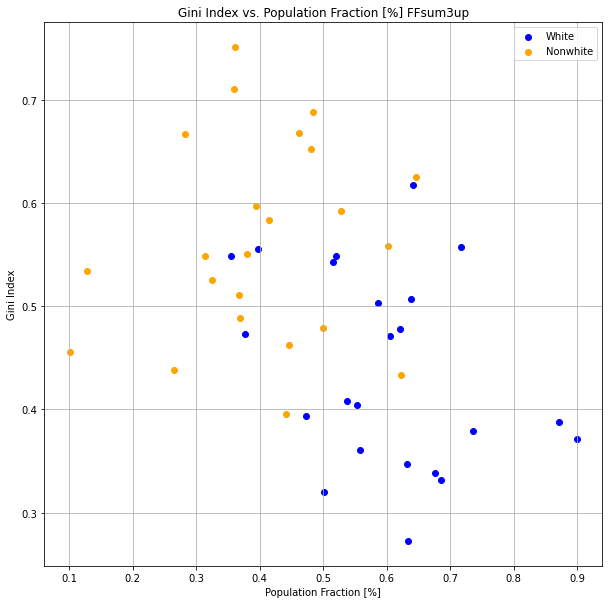

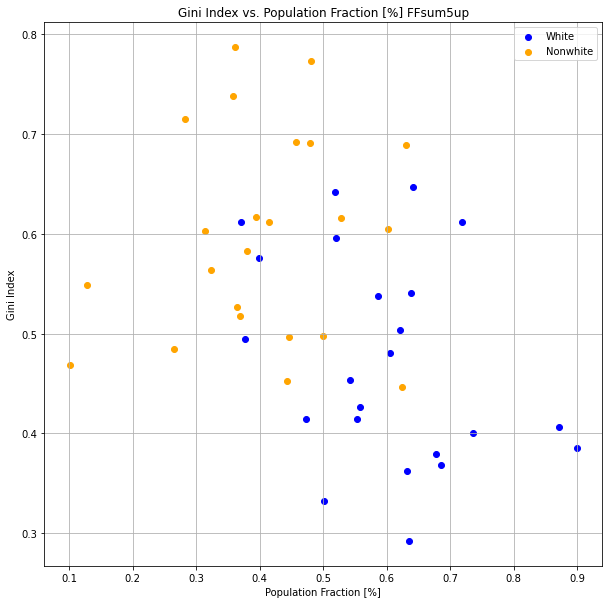

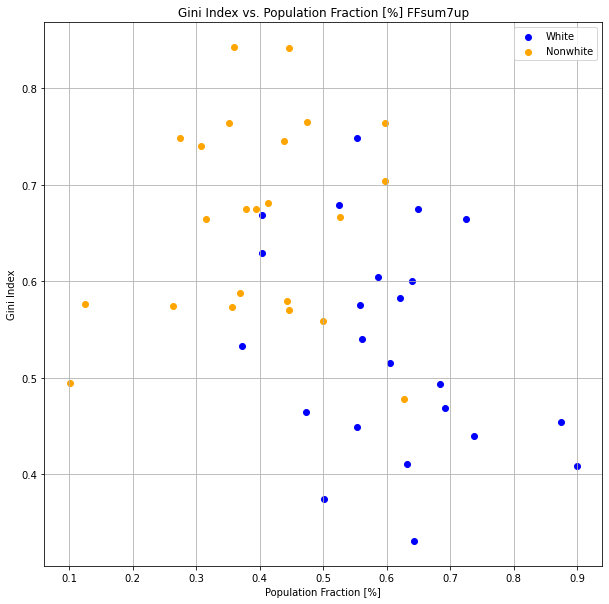

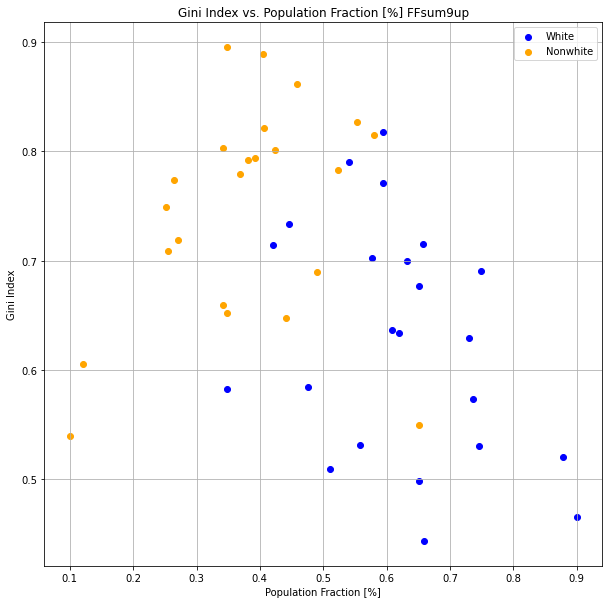

In [7]:
# comparison plot (Gini)
comparison_plot([df_coastalstates_FFsum_white_csv['popwhite']/df_coastalstates_FFsum_white_csv['poptotal'],df_coastalstates_FFsum_white_csv['Gini_white']],
                [df_coastalstates_FFsum_white_csv['popnonwhite']/df_coastalstates_FFsum_white_csv['poptotal'], df_coastalstates_FFsum_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum','CoastalStates','gini_pd')
comparison_plot([df_coastalstates_FFsum3up_white_csv['popwhite']/df_coastalstates_FFsum3up_white_csv['poptotal'],df_coastalstates_FFsum3up_white_csv['Gini_white']],
                [df_coastalstates_FFsum3up_white_csv['popnonwhite']/df_coastalstates_FFsum3up_white_csv['poptotal'], df_coastalstates_FFsum3up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum3up','CoastalStates','gini_pd')
comparison_plot([df_coastalstates_FFsum5up_white_csv['popwhite']/df_coastalstates_FFsum5up_white_csv['poptotal'],df_coastalstates_FFsum5up_white_csv['Gini_white']],
                [df_coastalstates_FFsum5up_white_csv['popnonwhite']/df_coastalstates_FFsum5up_white_csv['poptotal'], df_coastalstates_FFsum5up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum5up','CoastalStates','gini_pd')
comparison_plot([df_coastalstates_FFsum7up_white_csv['popwhite']/df_coastalstates_FFsum7up_white_csv['poptotal'],df_coastalstates_FFsum7up_white_csv['Gini_white']],
                [df_coastalstates_FFsum7up_white_csv['popnonwhite']/df_coastalstates_FFsum7up_white_csv['poptotal'], df_coastalstates_FFsum7up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum7up','CoastalStates','gini_pd')
comparison_plot([df_coastalstates_FFsum9up_white_csv['popwhite']/df_coastalstates_FFsum9up_white_csv['poptotal'],df_coastalstates_FFsum9up_white_csv['Gini_white']],
                [df_coastalstates_FFsum9up_white_csv['popnonwhite']/df_coastalstates_FFsum9up_white_csv['poptotal'], df_coastalstates_FFsum9up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum9up','CoastalStates','gini_pd')
;

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


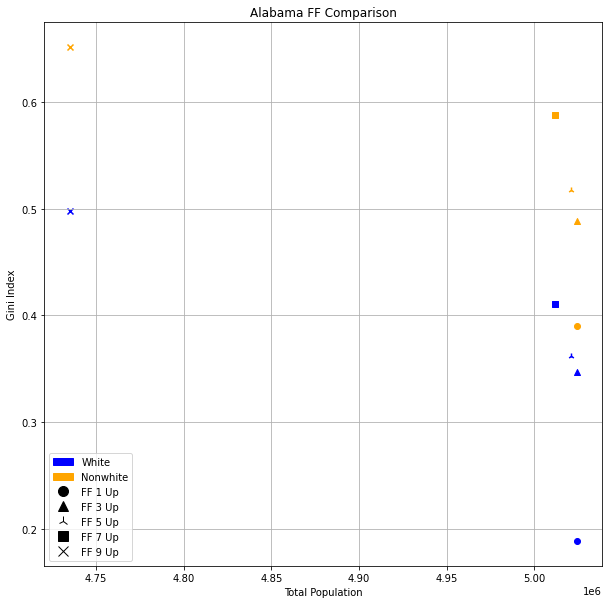

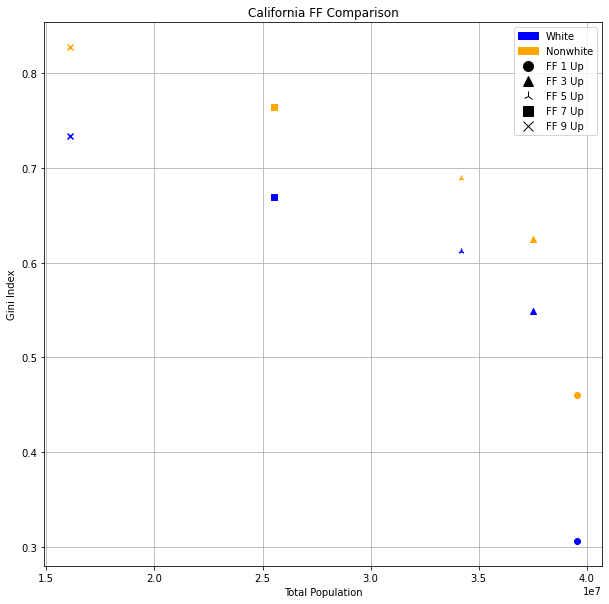

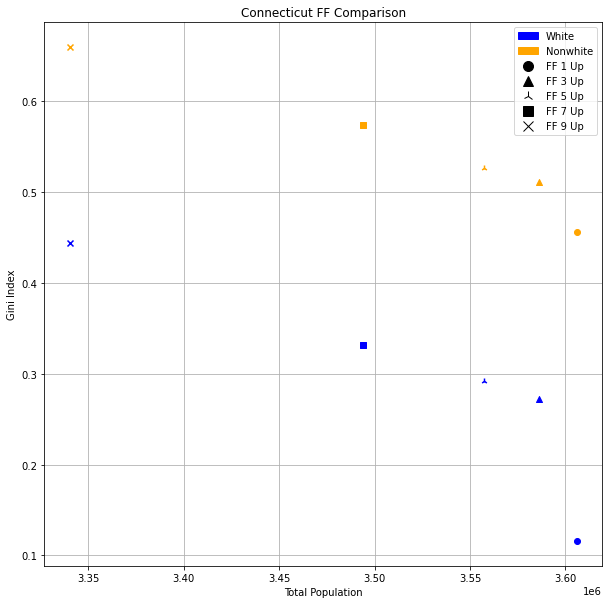

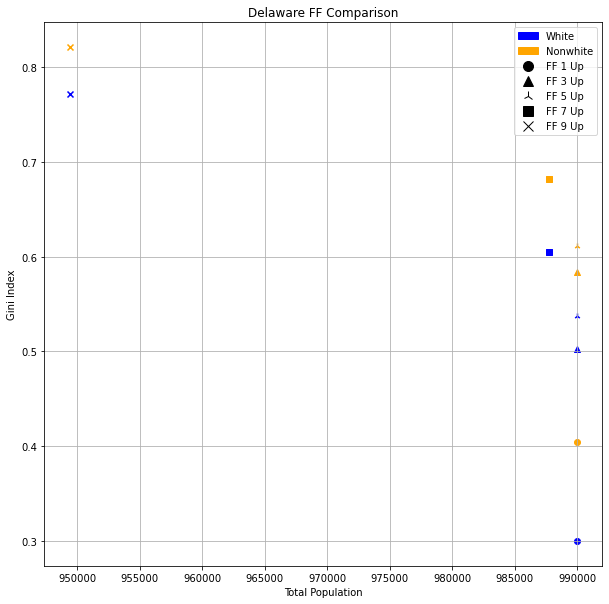

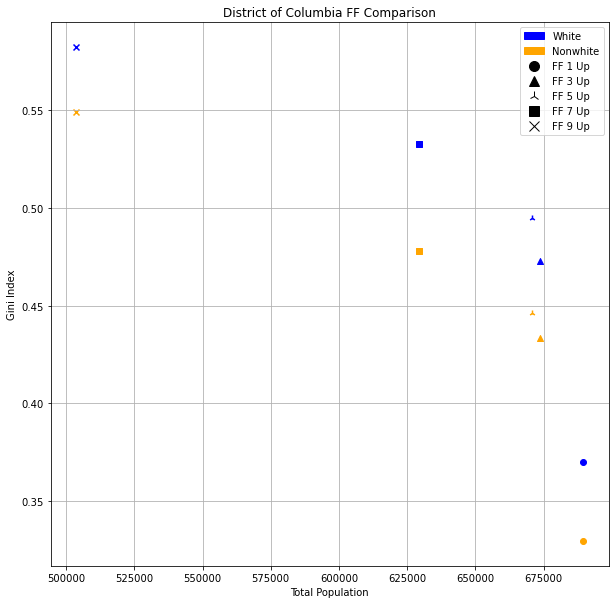

...

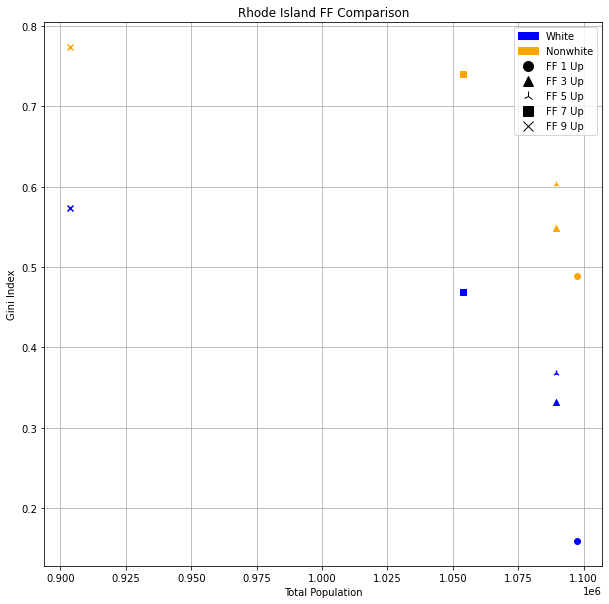

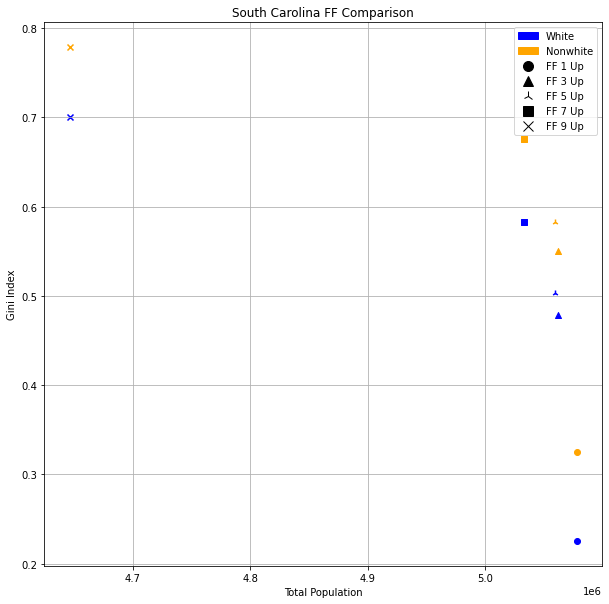

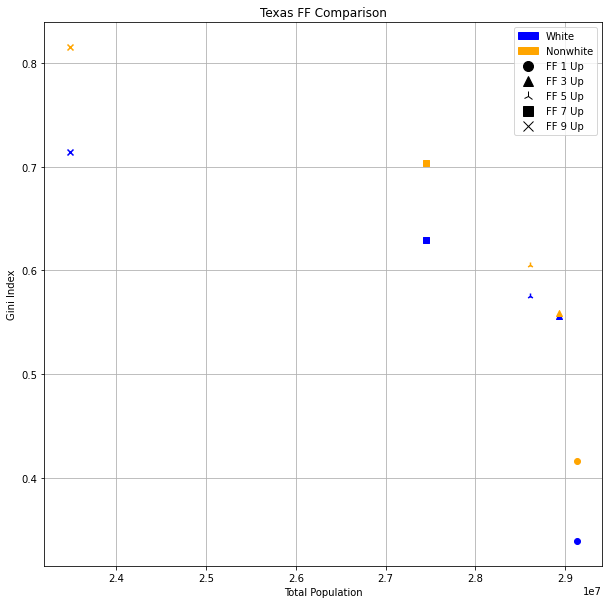

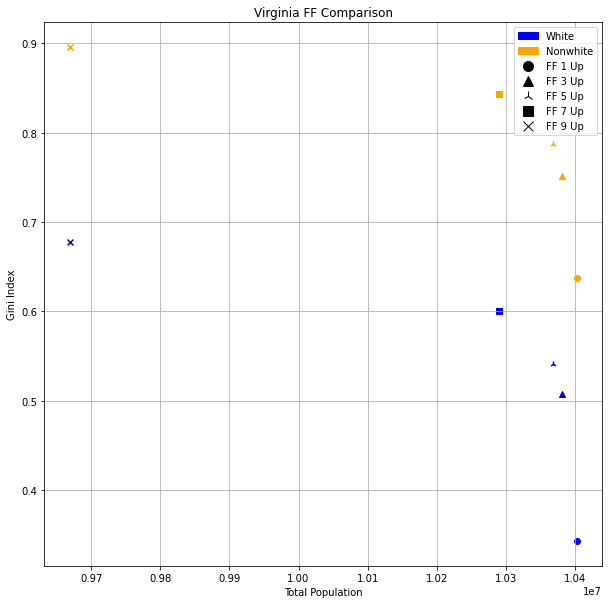

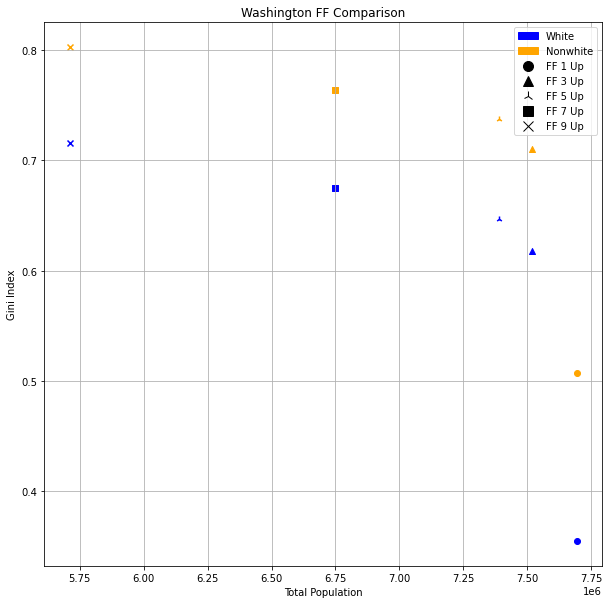

In [8]:
# comparison plot for state at different FF
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

vd_coastalstates_white_gini = pd.DataFrame(columns=['State','VertDist_ave','VertDist_sum','VertDist_FFsum','VertDist_FFsum3up',
                                                    'VertDist_FFsum5up','VertDist_FFsum7up','VertDist_FFsum9up'])

for i in coastalstates:
    row_state_FFsum = df_coastalstates_FFsum_white_csv[df_coastalstates_FFsum_white_csv['State'].str.endswith(i)]
    row_state_FFsum3up = df_coastalstates_FFsum3up_white_csv[df_coastalstates_FFsum3up_white_csv['State'].str.endswith(i)]
    row_state_FFsum5up = df_coastalstates_FFsum5up_white_csv[df_coastalstates_FFsum5up_white_csv['State'].str.endswith(i)]
    row_state_FFsum7up = df_coastalstates_FFsum7up_white_csv[df_coastalstates_FFsum7up_white_csv['State'].str.endswith(i)]
    row_state_FFsum9up = df_coastalstates_FFsum9up_white_csv[df_coastalstates_FFsum9up_white_csv['State'].str.endswith(i)]
    
    fig, ax = plt.subplots(figsize=(10,10))
    
    ax.scatter(row_state_FFsum['poptotal'],row_state_FFsum['Gini_white'], color='blue')
    ax.scatter(row_state_FFsum['poptotal'],row_state_FFsum['Gini_nonwhite'], color='orange')
    ax.scatter(row_state_FFsum3up['poptotal'],row_state_FFsum3up['Gini_white'], color='blue',marker='^')
    ax.scatter(row_state_FFsum3up['poptotal'],row_state_FFsum3up['Gini_nonwhite'], color='orange',marker='^')
    ax.scatter(row_state_FFsum5up['poptotal'],row_state_FFsum5up['Gini_white'], color='blue',marker='2')
    ax.scatter(row_state_FFsum5up['poptotal'],row_state_FFsum5up['Gini_nonwhite'], color='orange',marker='2')
    ax.scatter(row_state_FFsum7up['poptotal'],row_state_FFsum7up['Gini_white'], color='blue',marker='s')
    ax.scatter(row_state_FFsum7up['poptotal'],row_state_FFsum7up['Gini_nonwhite'], color='orange',marker='s')
    ax.scatter(row_state_FFsum9up['poptotal'],row_state_FFsum9up['Gini_white'], color='blue',marker='x')
    ax.scatter(row_state_FFsum9up['poptotal'],row_state_FFsum9up['Gini_nonwhite'], color='orange',marker='x')

    ax.set_title(i+' FF Comparison')
    ax.set_xlabel('Total Population')
    ax.set_ylabel('Gini Index')
    demo_patch = mpatches.Patch(color='blue', label='White')
    nondemo_patch = mpatches.Patch(color='orange', label='Nonwhite')
    FFsum_patch = mlines.Line2D([], [], color='black', marker='o', linestyle='None',markersize=10, label='FF 1 Up')
    FFsum3up_patch = mlines.Line2D([], [], color='black', marker='^', linestyle='None',markersize=10, label='FF 3 Up')
    FFsum5up_patch = mlines.Line2D([], [], color='black', marker='2', linestyle='None',markersize=10, label='FF 5 Up')
    FFsum7up_patch = mlines.Line2D([], [], color='black', marker='s', linestyle='None',markersize=10, label='FF 7 Up')
    FFsum9up_patch = mlines.Line2D([], [], color='black', marker='x', linestyle='None',markersize=10, label='FF 9 Up')
    ax.legend(handles=[demo_patch, nondemo_patch, FFsum_patch, FFsum3up_patch, FFsum5up_patch, FFsum7up_patch, FFsum9up_patch])
    ax.grid(True)
    
    # absolute value vertical distance between Gini Index
    vd1 = np.max(row_state_FFsum[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_FFsum[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd3 = np.max(row_state_FFsum3up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_FFsum3up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd5 = np.max(row_state_FFsum5up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_FFsum5up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd7 = np.max(row_state_FFsum7up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_FFsum7up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd9 = np.max(row_state_FFsum9up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_FFsum9up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vdsum = vd1+vd3+vd5+vd7+vd9
    vdave = vdsum/5
    vd_coastalstates_white_gini = vd_coastalstates_white_gini.append({'State':i,'VertDist_ave':vdave,'VertDist_sum':vdsum,'VertDist_FFsum':vd1,'VertDist_FFsum3up':vd3,
                                                                      'VertDist_FFsum5up':vd5,'VertDist_FFsum7up':vd7,'VertDist_FFsum9up':vd9}, ignore_index=True)

    plt.savefig('results/GlobalComparisonPlots/CoastalStates/'+i+'_FFComparison_white.png', dpi=300, bbox_inches='tight')
vd_coastalstates_white_gini.to_csv('results/GlobalComparisonPlots/CoastalStates/VerticalDistance_white.csv')

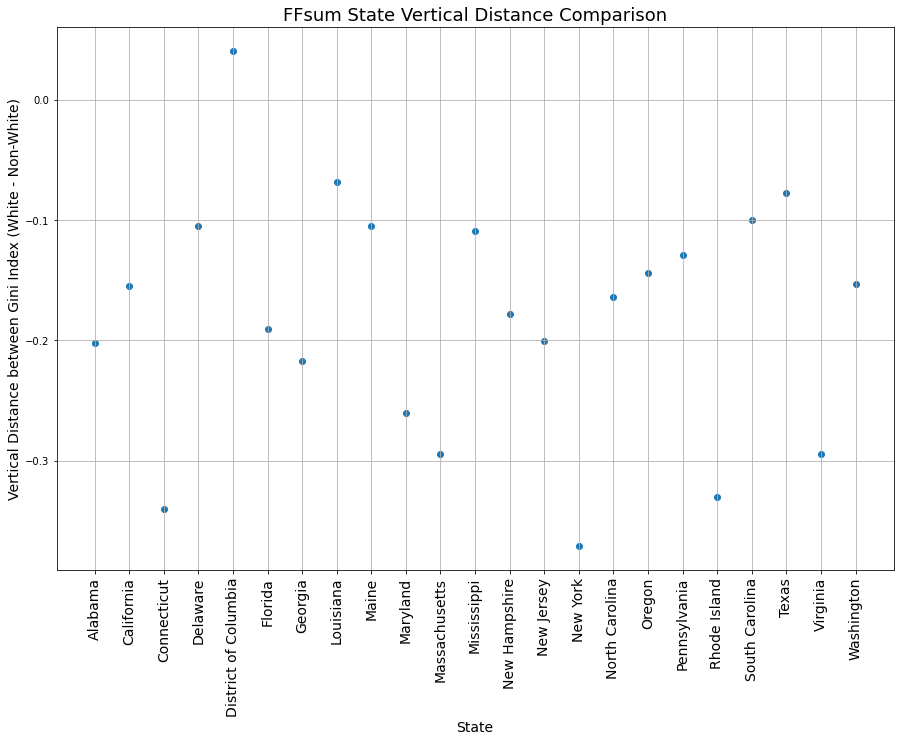

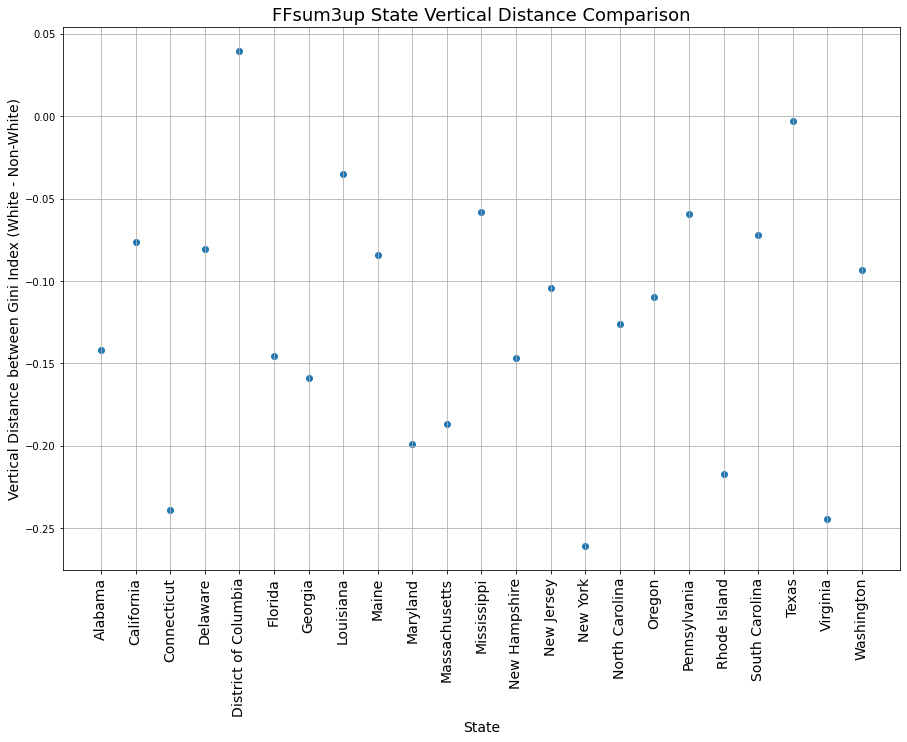

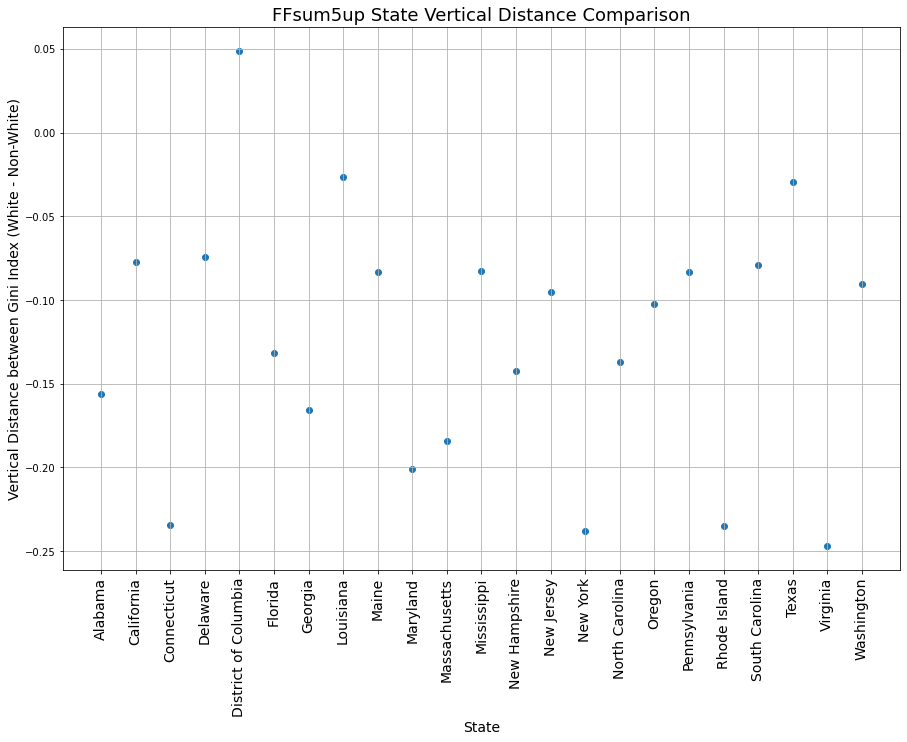

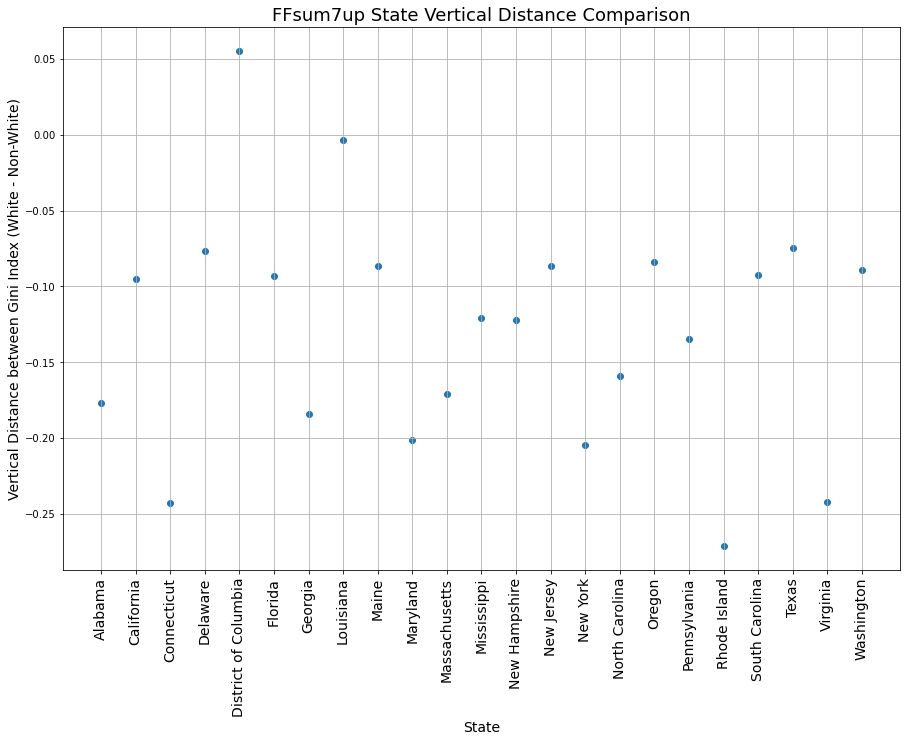

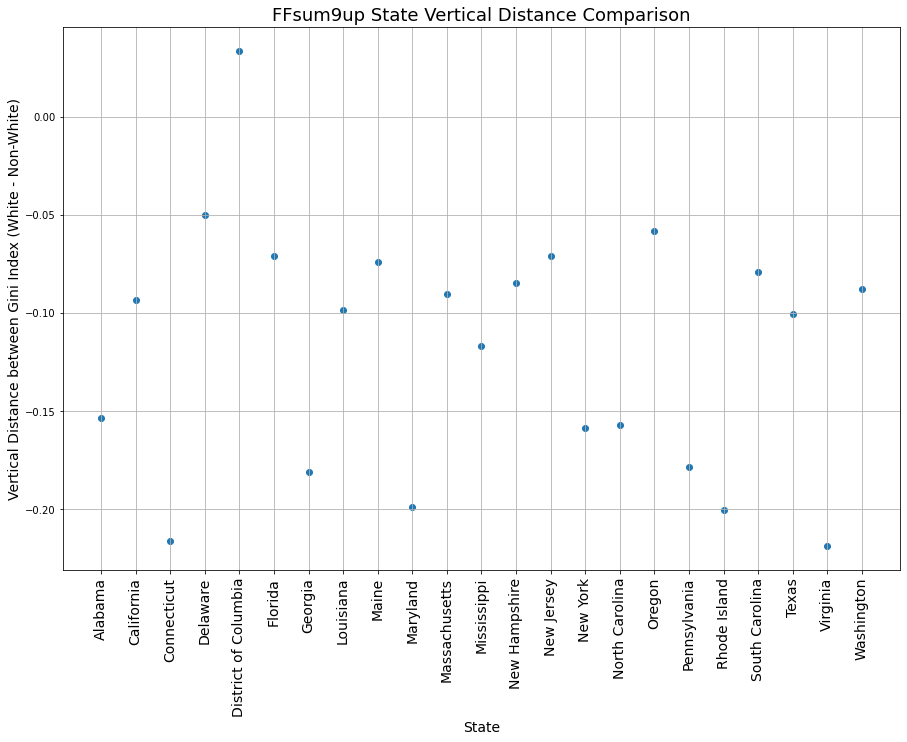

In [46]:
# state vertical distance comparison
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

state = []
vd1_diff =[]
vd3_diff =[]
vd5_diff =[]
vd7_diff =[]
vd9_diff =[]
vd9diff_vd3diff =[]

for i in coastalstates:
    row_state_FFsum = df_coastalstates_FFsum_white_csv[df_coastalstates_FFsum_white_csv['State'].str.endswith(i)]
    row_state_FFsum3up = df_coastalstates_FFsum3up_white_csv[df_coastalstates_FFsum3up_white_csv['State'].str.endswith(i)]
    row_state_FFsum5up = df_coastalstates_FFsum5up_white_csv[df_coastalstates_FFsum5up_white_csv['State'].str.endswith(i)]
    row_state_FFsum7up = df_coastalstates_FFsum7up_white_csv[df_coastalstates_FFsum7up_white_csv['State'].str.endswith(i)]
    row_state_FFsum9up = df_coastalstates_FFsum9up_white_csv[df_coastalstates_FFsum9up_white_csv['State'].str.endswith(i)]
    
    # difference in vertical distances is determined by VDdiff = (Gini of majority demo) - (Gini of non-majority demo)
    vd1_diff.append(row_state_FFsum['Gini_white']-row_state_FFsum['Gini_nonwhite'])
    vd3_diff.append(row_state_FFsum3up['Gini_white']-row_state_FFsum3up['Gini_nonwhite'])
    vd5_diff.append(row_state_FFsum5up['Gini_white']-row_state_FFsum5up['Gini_nonwhite'])
    vd7_diff.append(row_state_FFsum7up['Gini_white']-row_state_FFsum7up['Gini_nonwhite'])
    vd9_diff.append(row_state_FFsum9up['Gini_white']-row_state_FFsum9up['Gini_nonwhite'])
    vd9diff_vd3diff.append((row_state_FFsum9up['Gini_white']-row_state_FFsum9up['Gini_nonwhite'])/(row_state_FFsum3up['Gini_white']-row_state_FFsum3up['Gini_nonwhite']))
    
    state.append(i)

dictlist = {'State':state,'VDdiff_FFsum':vd1_diff,'VDdiff_FFsum3up':vd3_diff,'VDdiff_FFsum5up':vd5_diff,
            'VDdiff_FFsum7up':vd7_diff,'VDdiff_FFsum9up':vd9_diff,'VDdiffratio_9over3':vd9diff_vd3diff}
vddiff_coastalstates_white_gini = pd.DataFrame(dictlist)
vddiff_coastalstates_white_gini[['VDdiff_FFsum','VDdiff_FFsum3up','VDdiff_FFsum5up','VDdiff_FFsum7up','VDdiff_FFsum9up','VDdiffratio_9over3']] = vddiff_coastalstates_white_gini[['VDdiff_FFsum','VDdiff_FFsum3up','VDdiff_FFsum5up','VDdiff_FFsum7up','VDdiff_FFsum9up','VDdiffratio_9over3']].astype('float64')
vddiff_coastalstates_white_gini.to_csv('results/VertDistPlots/CoastalStates/VDdiff_white.csv')

FFs = ['FFsum','FFsum3up','FFsum5up','FFsum7up','FFsum9up']

for i in FFs:
    fig, ax = plt.subplots(figsize=(15,10))
    
    ax.scatter(vddiff_coastalstates_white_gini['State'],vddiff_coastalstates_white_gini['VDdiff_'+i])
    
    ax.set_title(i+' State Vertical Distance Comparison',fontsize=18)
    ax.set_xlabel('State',fontsize=14)
    ax.set_ylabel('Vertical Distance between Gini Index (White - Non-White)',fontsize=14)
    plt.xticks(rotation=90,fontsize=14)
    ax.grid(True)
    
    plt.savefig('results/VertDistPlots/CoastalStates/'+i+'_white.png', dpi=300, bbox_inches='tight')

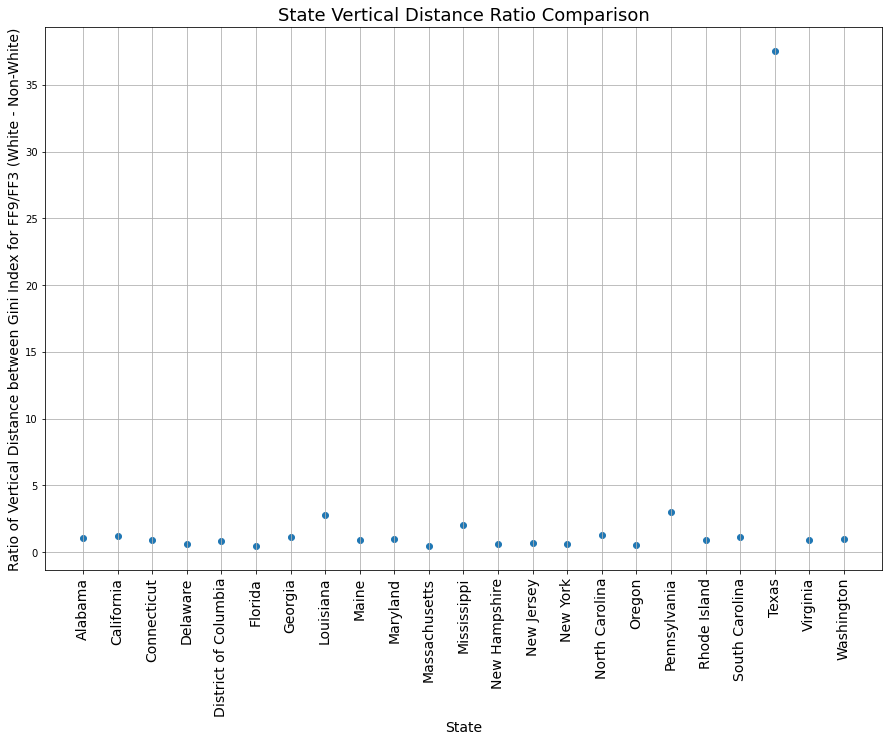

In [10]:
# state vertical distance ratio comparison
fig, ax = plt.subplots(figsize=(15,10))

ax.scatter(vddiff_coastalstates_white_gini['State'],vddiff_coastalstates_white_gini['VDdiffratio_9over3'])
    
ax.set_title('State Vertical Distance Ratio Comparison',fontsize=18)
ax.set_xlabel('State',fontsize=14)
ax.set_ylabel('Ratio of Vertical Distance between Gini Index for FF9/FF3 (White - Non-White)',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
ax.grid(True)
    
plt.savefig('results/VertDistPlots/CoastalStates/VDratio9over3_white.png', dpi=300, bbox_inches='tight')

## Coastal States (Only Coastal Counties)

States (including D.C.) in the contiguous U.S. containing coastal counties according to NOAA Fisheries. Analysis based only on tracts contained within those coastal counties.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

### White

In [11]:
# dataframe generation
df_coastalstates_CC_FFsum = read('data/tract_coastalcounties.csv','white','FFsum')
df_coastalstates_CC_FFsum3up = read('data/tract_coastalcounties.csv','white','FFsum3up')
df_coastalstates_CC_FFsum5up = read('data/tract_coastalcounties.csv','white','FFsum5up')
df_coastalstates_CC_FFsum7up = read('data/tract_coastalcounties.csv','white','FFsum7up')
df_coastalstates_CC_FFsum9up = read('data/tract_coastalcounties.csv','white','FFsum9up')

C:\Users\jade02\Desktop\Research\Analysis\CoastalTract\CoastalTract_Python_WF\lorenz_curve.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(6,6))


''

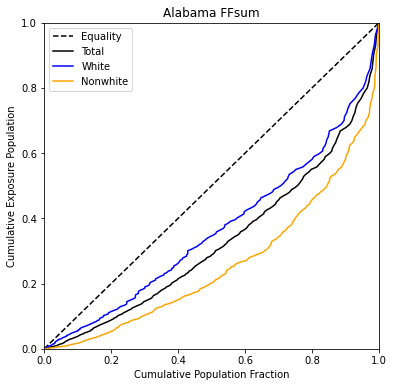

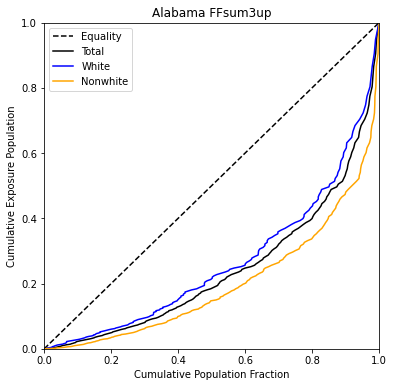

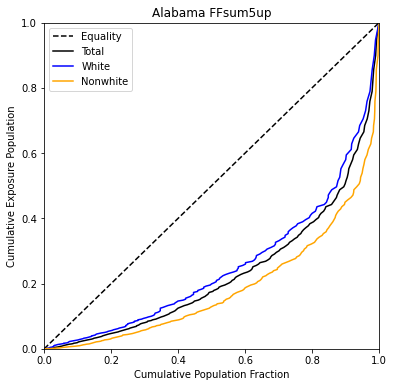

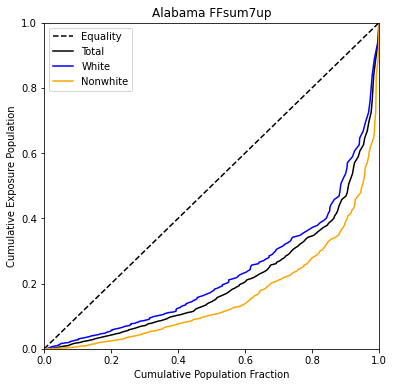

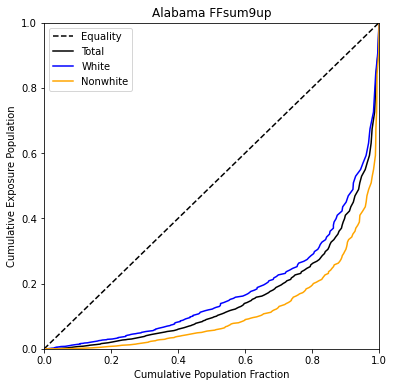

...

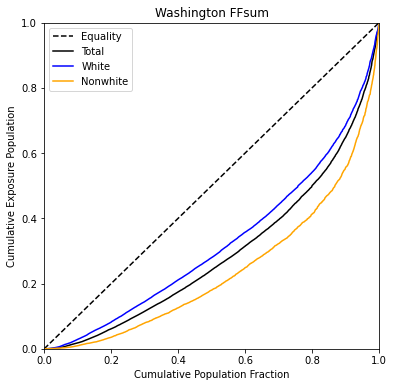

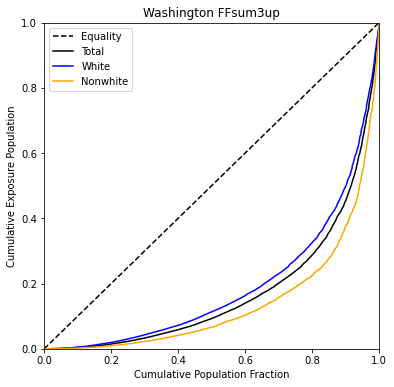

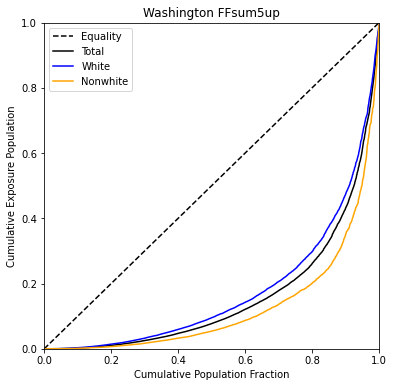

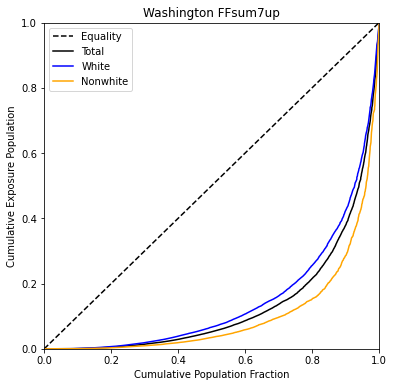

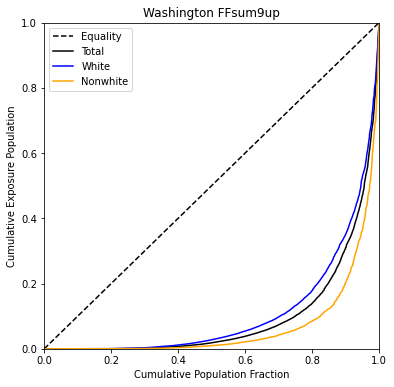

In [12]:
# lorenz curves
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

for i in coastalstates:
    df_coastalstates_CC_FFsum_state = state_dfs(df_coastalstates_CC_FFsum,'white','FFsum',i)
    df_coastalstates_CC_FFsum3up_state = state_dfs(df_coastalstates_CC_FFsum3up,'white','FFsum3up',i)
    df_coastalstates_CC_FFsum5up_state = state_dfs(df_coastalstates_CC_FFsum3up,'white','FFsum5up',i)
    df_coastalstates_CC_FFsum7up_state = state_dfs(df_coastalstates_CC_FFsum3up,'white','FFsum7up',i)
    df_coastalstates_CC_FFsum9up_state = state_dfs(df_coastalstates_CC_FFsum3up,'white','FFsum9up',i)
    
    lorenz_curve(df_coastalstates_CC_FFsum_state[0],df_coastalstates_CC_FFsum_state[1],df_coastalstates_CC_FFsum_state[2],'white','FFsum','CoastalStates_CC',i)
    lorenz_curve(df_coastalstates_CC_FFsum3up_state[0],df_coastalstates_CC_FFsum3up_state[1],df_coastalstates_CC_FFsum3up_state[2],'white','FFsum3up','CoastalStates_CC',i)
    lorenz_curve(df_coastalstates_CC_FFsum5up_state[0],df_coastalstates_CC_FFsum5up_state[1],df_coastalstates_CC_FFsum5up_state[2],'white','FFsum5up','CoastalStates_CC',i)
    lorenz_curve(df_coastalstates_CC_FFsum7up_state[0],df_coastalstates_CC_FFsum7up_state[1],df_coastalstates_CC_FFsum7up_state[2],'white','FFsum7up','CoastalStates_CC',i)
    lorenz_curve(df_coastalstates_CC_FFsum9up_state[0],df_coastalstates_CC_FFsum9up_state[1],df_coastalstates_CC_FFsum9up_state[2],'white','FFsum9up','CoastalStates_CC',i)
;

In [47]:
# csv generation
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

state_csvs(df_coastalstates_CC_FFsum,coastalstates,'white','FFsum','CoastalStates_CC')
state_csvs(df_coastalstates_CC_FFsum3up,coastalstates,'white','FFsum3up','CoastalStates_CC')
state_csvs(df_coastalstates_CC_FFsum5up,coastalstates,'white','FFsum5up','CoastalStates_CC')
state_csvs(df_coastalstates_CC_FFsum7up,coastalstates,'white','FFsum7up','CoastalStates_CC')
state_csvs(df_coastalstates_CC_FFsum9up,coastalstates,'white','FFsum9up','CoastalStates_CC')
;

''

In [14]:
# read csvs
df_coastalstates_CC_FFsum_white_csv = pd.read_csv('results/csvs/CoastalStates_CC/white_FFsum.csv')
df_coastalstates_CC_FFsum3up_white_csv = pd.read_csv('results/csvs/CoastalStates_CC/white_FFsum3up.csv')
df_coastalstates_CC_FFsum5up_white_csv = pd.read_csv('results/csvs/CoastalStates_CC/white_FFsum5up.csv')
df_coastalstates_CC_FFsum7up_white_csv = pd.read_csv('results/csvs/CoastalStates_CC/white_FFsum7up.csv')
df_coastalstates_CC_FFsum9up_white_csv = pd.read_csv('results/csvs/CoastalStates_CC/white_FFsum9up.csv')

''

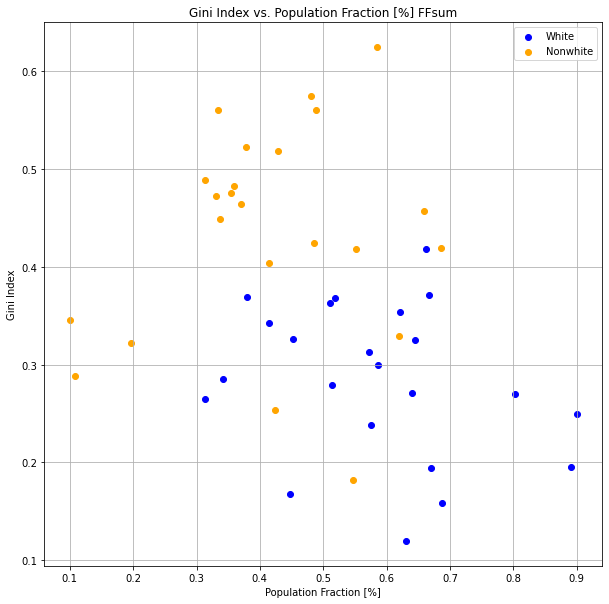

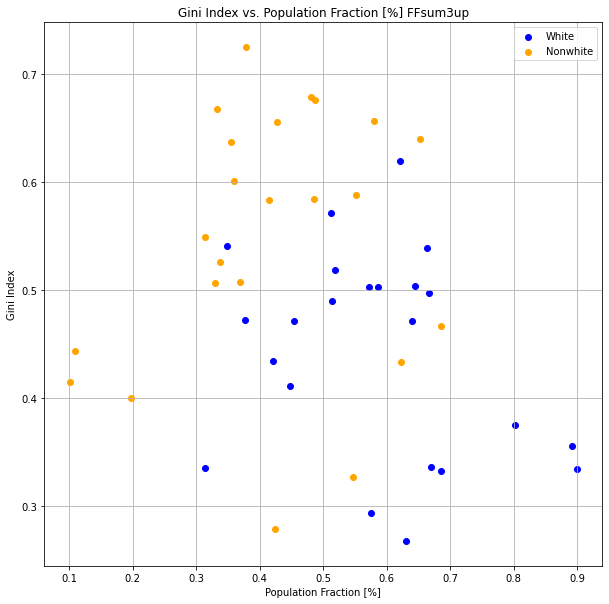

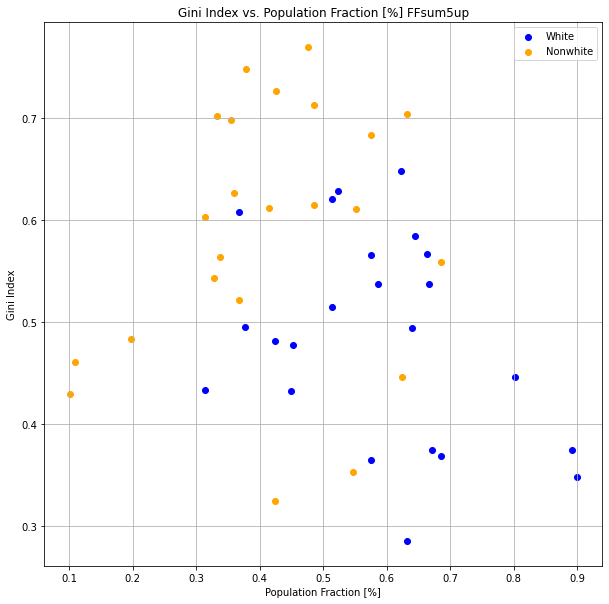

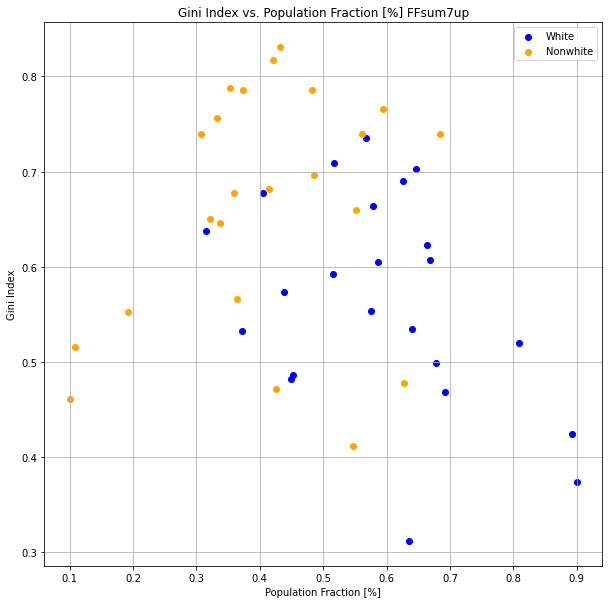

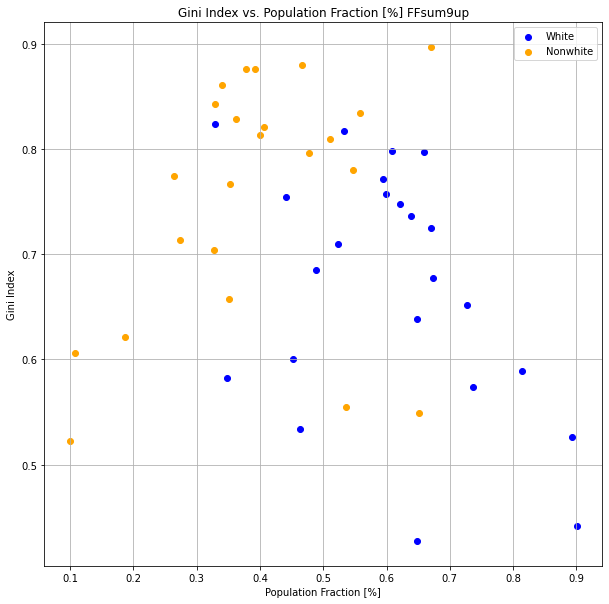

In [15]:
# comparison plot (Gini)
comparison_plot([df_coastalstates_CC_FFsum_white_csv['popwhite']/df_coastalstates_CC_FFsum_white_csv['poptotal'],df_coastalstates_CC_FFsum_white_csv['Gini_white']],
                [df_coastalstates_CC_FFsum_white_csv['popnonwhite']/df_coastalstates_CC_FFsum_white_csv['poptotal'], df_coastalstates_CC_FFsum_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum','CoastalStates_CC','gini_pd')
comparison_plot([df_coastalstates_CC_FFsum3up_white_csv['popwhite']/df_coastalstates_CC_FFsum3up_white_csv['poptotal'],df_coastalstates_CC_FFsum3up_white_csv['Gini_white']],
                [df_coastalstates_CC_FFsum3up_white_csv['popnonwhite']/df_coastalstates_CC_FFsum3up_white_csv['poptotal'], df_coastalstates_CC_FFsum3up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum3up','CoastalStates_CC','gini_pd')
comparison_plot([df_coastalstates_CC_FFsum5up_white_csv['popwhite']/df_coastalstates_CC_FFsum5up_white_csv['poptotal'],df_coastalstates_CC_FFsum5up_white_csv['Gini_white']],
                [df_coastalstates_CC_FFsum5up_white_csv['popnonwhite']/df_coastalstates_CC_FFsum5up_white_csv['poptotal'], df_coastalstates_CC_FFsum5up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum5up','CoastalStates_CC','gini_pd')
comparison_plot([df_coastalstates_CC_FFsum7up_white_csv['popwhite']/df_coastalstates_CC_FFsum7up_white_csv['poptotal'],df_coastalstates_CC_FFsum7up_white_csv['Gini_white']],
                [df_coastalstates_CC_FFsum7up_white_csv['popnonwhite']/df_coastalstates_CC_FFsum7up_white_csv['poptotal'], df_coastalstates_CC_FFsum7up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum7up','CoastalStates_CC','gini_pd')
comparison_plot([df_coastalstates_CC_FFsum9up_white_csv['popwhite']/df_coastalstates_CC_FFsum9up_white_csv['poptotal'],df_coastalstates_CC_FFsum9up_white_csv['Gini_white']],
                [df_coastalstates_CC_FFsum9up_white_csv['popnonwhite']/df_coastalstates_CC_FFsum9up_white_csv['poptotal'], df_coastalstates_CC_FFsum9up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum9up','CoastalStates_CC','gini_pd')
;

C:\Program Files\ArcGIS\Pro\bin\Python\envs\arcgispro-py3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


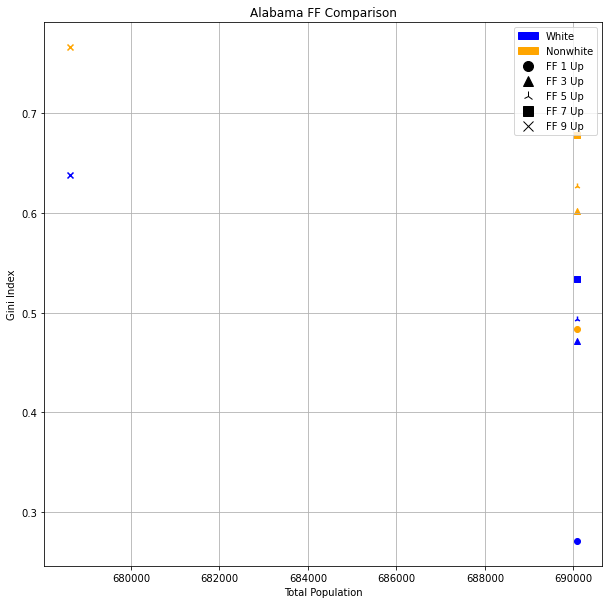

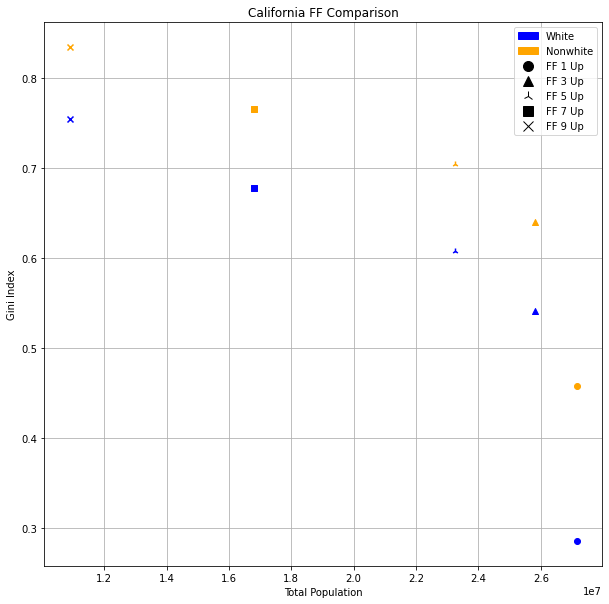

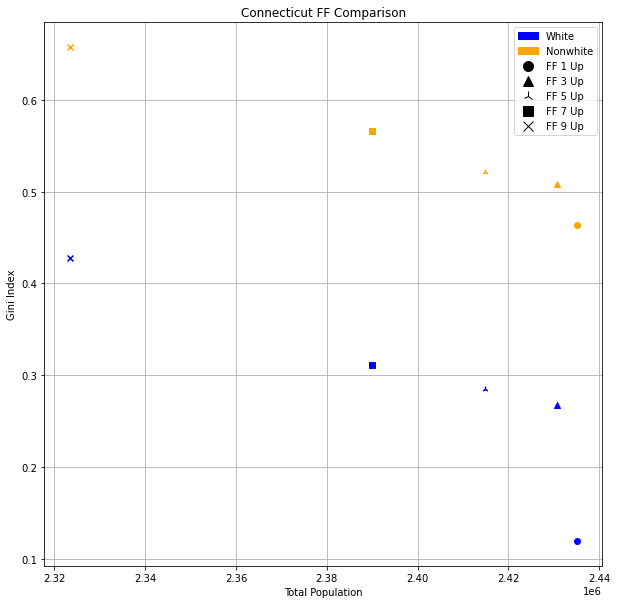

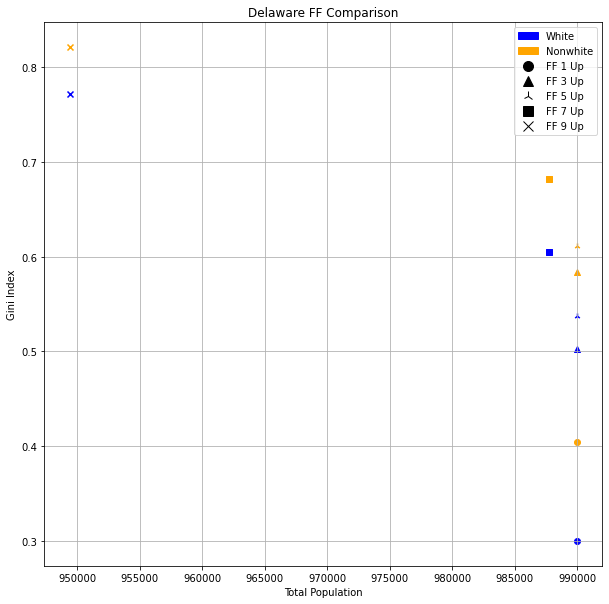

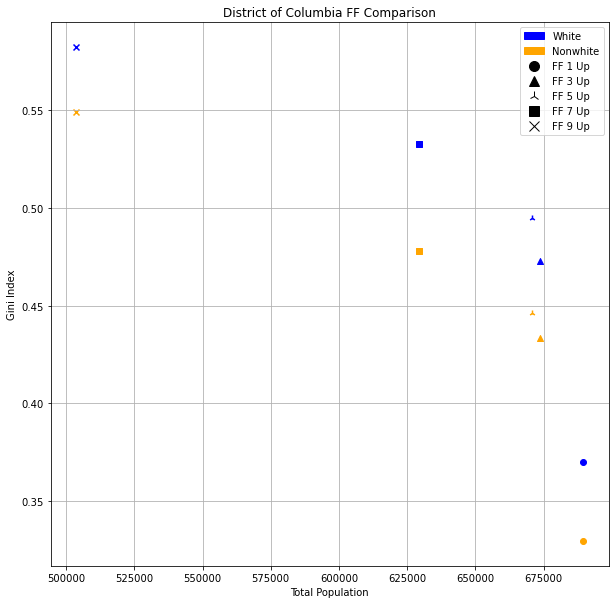

...

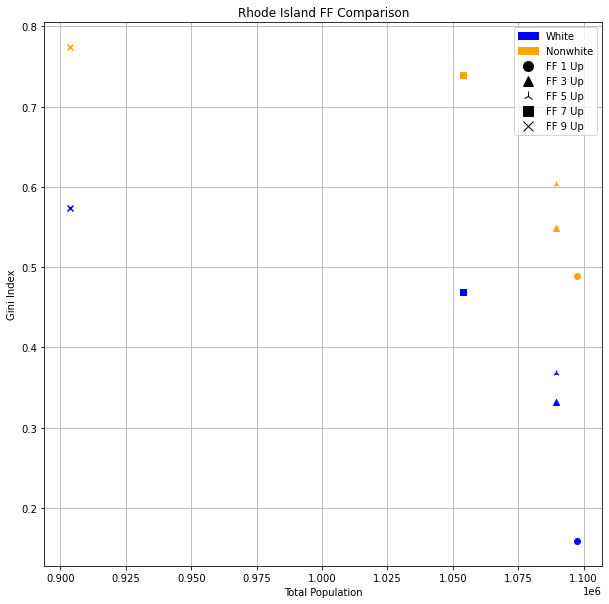

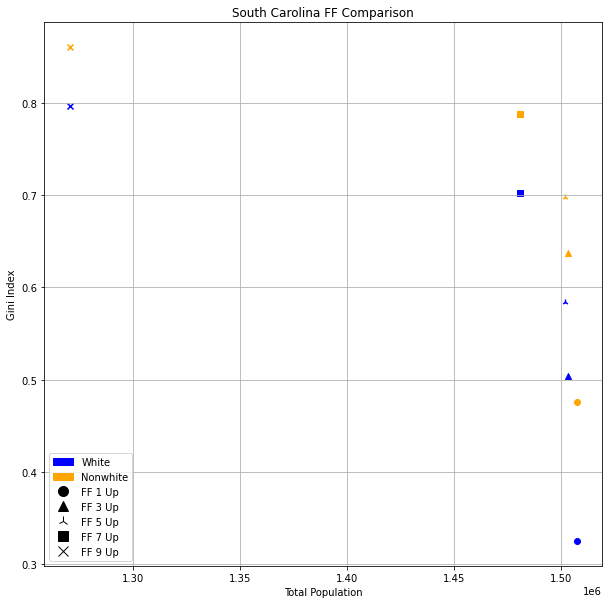

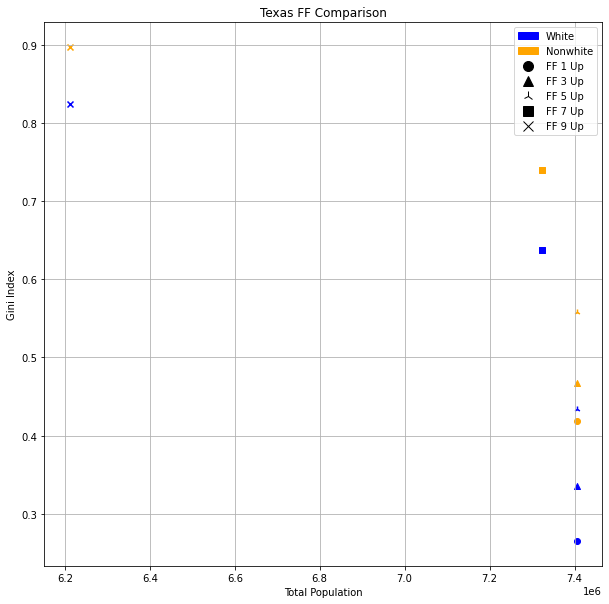

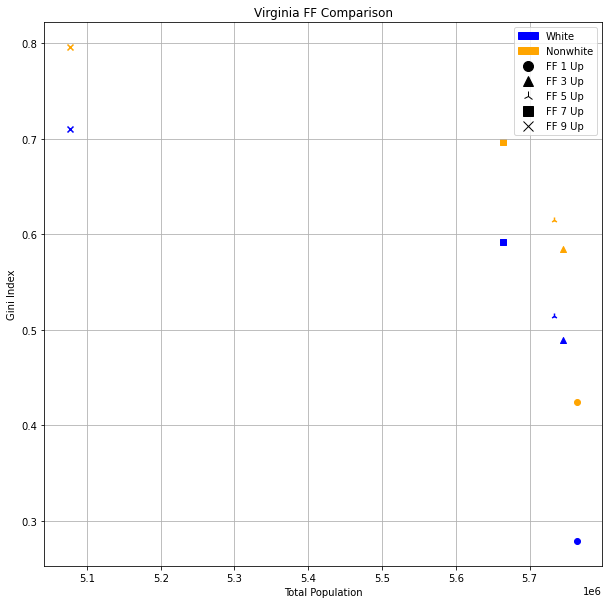

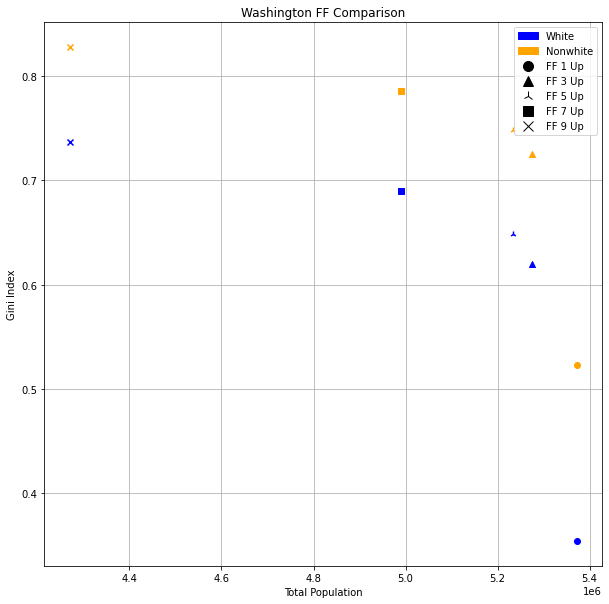

In [16]:
# comparison plot for state at different FF
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

vd_coastalstates_CC_white_gini = pd.DataFrame(columns=['State','VertDist_ave','VertDist_sum','VertDist_FFsum','VertDist_FFsum3up',
                                                    'VertDist_FFsum5up','VertDist_FFsum7up','VertDist_FFsum9up'])

for i in coastalstates:
    row_state_CC_FFsum = df_coastalstates_CC_FFsum_white_csv[df_coastalstates_CC_FFsum_white_csv['State'].str.endswith(i)]
    row_state_CC_FFsum3up = df_coastalstates_CC_FFsum3up_white_csv[df_coastalstates_CC_FFsum3up_white_csv['State'].str.endswith(i)]
    row_state_CC_FFsum5up = df_coastalstates_CC_FFsum5up_white_csv[df_coastalstates_CC_FFsum5up_white_csv['State'].str.endswith(i)]
    row_state_CC_FFsum7up = df_coastalstates_CC_FFsum7up_white_csv[df_coastalstates_CC_FFsum7up_white_csv['State'].str.endswith(i)]
    row_state_CC_FFsum9up = df_coastalstates_CC_FFsum9up_white_csv[df_coastalstates_CC_FFsum9up_white_csv['State'].str.endswith(i)]
    
    fig, ax = plt.subplots(figsize=(10,10))
    
    ax.scatter(row_state_CC_FFsum['poptotal'],row_state_CC_FFsum['Gini_white'], color='blue')
    ax.scatter(row_state_CC_FFsum['poptotal'],row_state_CC_FFsum['Gini_nonwhite'], color='orange')
    ax.scatter(row_state_CC_FFsum3up['poptotal'],row_state_CC_FFsum3up['Gini_white'], color='blue',marker='^')
    ax.scatter(row_state_CC_FFsum3up['poptotal'],row_state_CC_FFsum3up['Gini_nonwhite'], color='orange',marker='^')
    ax.scatter(row_state_CC_FFsum5up['poptotal'],row_state_CC_FFsum5up['Gini_white'], color='blue',marker='2')
    ax.scatter(row_state_CC_FFsum5up['poptotal'],row_state_CC_FFsum5up['Gini_nonwhite'], color='orange',marker='2')
    ax.scatter(row_state_CC_FFsum7up['poptotal'],row_state_CC_FFsum7up['Gini_white'], color='blue',marker='s')
    ax.scatter(row_state_CC_FFsum7up['poptotal'],row_state_CC_FFsum7up['Gini_nonwhite'], color='orange',marker='s')
    ax.scatter(row_state_CC_FFsum9up['poptotal'],row_state_CC_FFsum9up['Gini_white'], color='blue',marker='x')
    ax.scatter(row_state_CC_FFsum9up['poptotal'],row_state_CC_FFsum9up['Gini_nonwhite'], color='orange',marker='x')

    ax.set_title(i+' FF Comparison')
    ax.set_xlabel('Total Population')
    ax.set_ylabel('Gini Index')
    demo_patch = mpatches.Patch(color='blue', label='White')
    nondemo_patch = mpatches.Patch(color='orange', label='Nonwhite')
    FFsum_patch = mlines.Line2D([], [], color='black', marker='o', linestyle='None',markersize=10, label='FF 1 Up')
    FFsum3up_patch = mlines.Line2D([], [], color='black', marker='^', linestyle='None',markersize=10, label='FF 3 Up')
    FFsum5up_patch = mlines.Line2D([], [], color='black', marker='2', linestyle='None',markersize=10, label='FF 5 Up')
    FFsum7up_patch = mlines.Line2D([], [], color='black', marker='s', linestyle='None',markersize=10, label='FF 7 Up')
    FFsum9up_patch = mlines.Line2D([], [], color='black', marker='x', linestyle='None',markersize=10, label='FF 9 Up')
    ax.legend(handles=[demo_patch, nondemo_patch, FFsum_patch, FFsum3up_patch, FFsum5up_patch, FFsum7up_patch, FFsum9up_patch])
    ax.grid(True)

    # absolute value vertical distance between Gini Index
    vd1 = np.max(row_state_CC_FFsum[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_CC_FFsum[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd3 = np.max(row_state_CC_FFsum3up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_CC_FFsum3up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd5 = np.max(row_state_CC_FFsum5up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_CC_FFsum5up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd7 = np.max(row_state_CC_FFsum7up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_CC_FFsum7up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd9 = np.max(row_state_CC_FFsum9up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_state_CC_FFsum9up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vdsum = vd1+vd3+vd5+vd7+vd9
    vdave = vdsum/5
    vd_coastalstates_CC_white_gini = vd_coastalstates_CC_white_gini.append({'State':i,'VertDist_ave':vdave,'VertDist_sum':vdsum,'VertDist_FFsum':vd1,'VertDist_FFsum3up':vd3,
                                                                      'VertDist_FFsum5up':vd5,'VertDist_FFsum7up':vd7,'VertDist_FFsum9up':vd9}, ignore_index=True)

    plt.savefig('results/GlobalComparisonPlots/CoastalStates_CC/'+i+'_FFComparison_white.png', dpi=300, bbox_inches='tight')
vd_coastalstates_CC_white_gini.to_csv('results/GlobalComparisonPlots/CoastalStates_CC/VerticalDistance_white.csv')

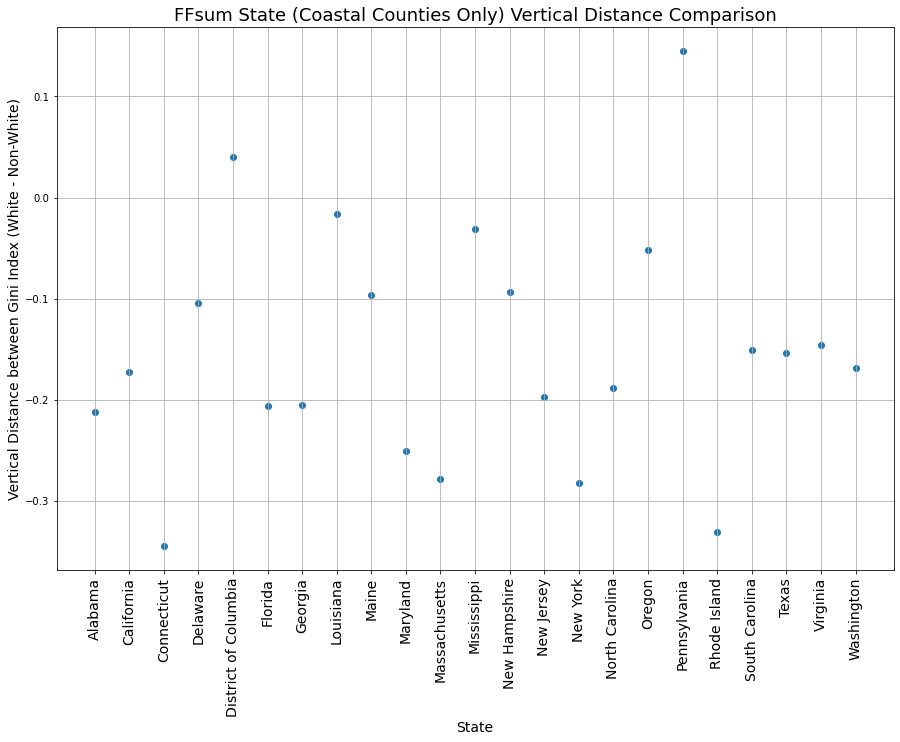

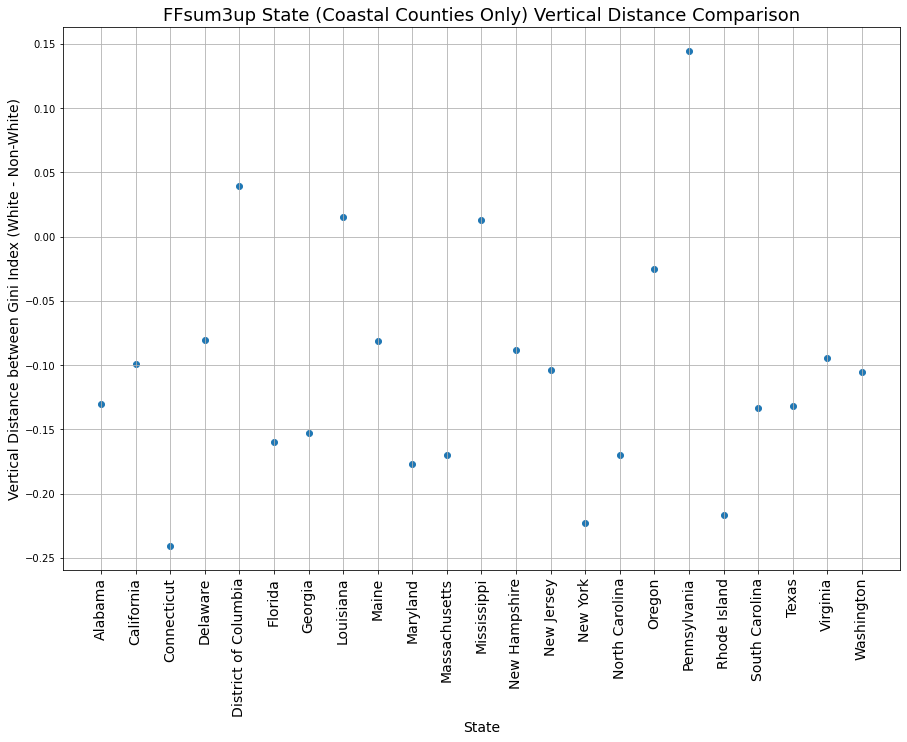

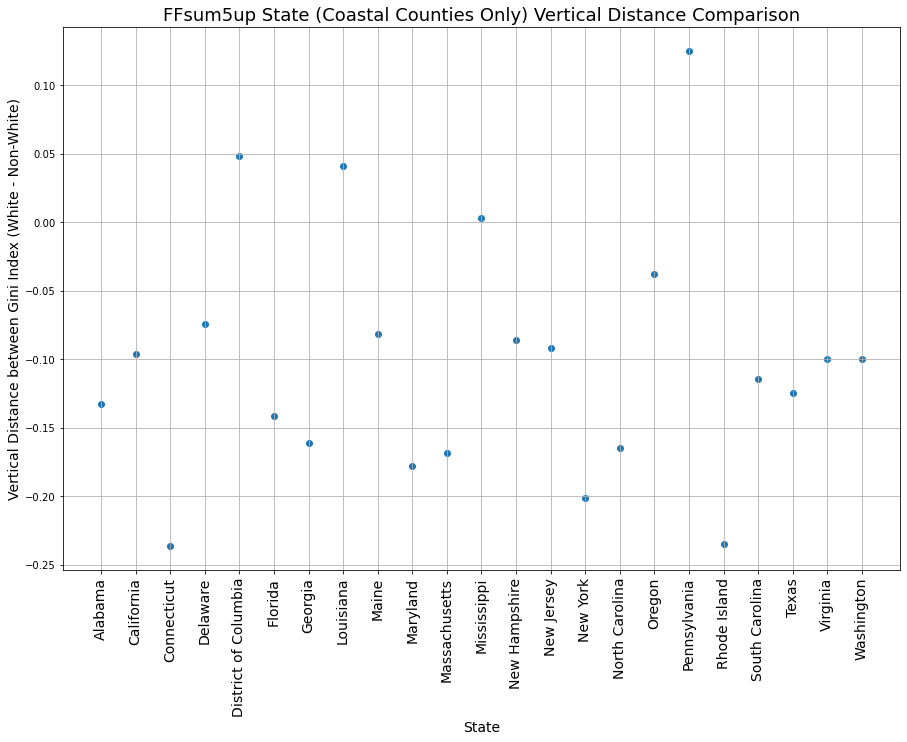

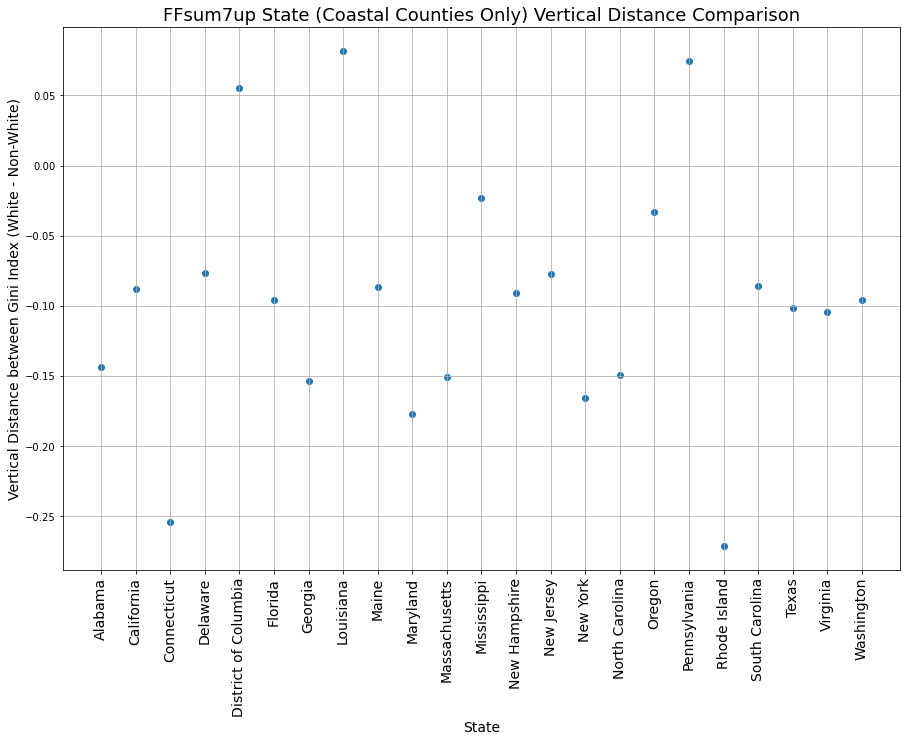

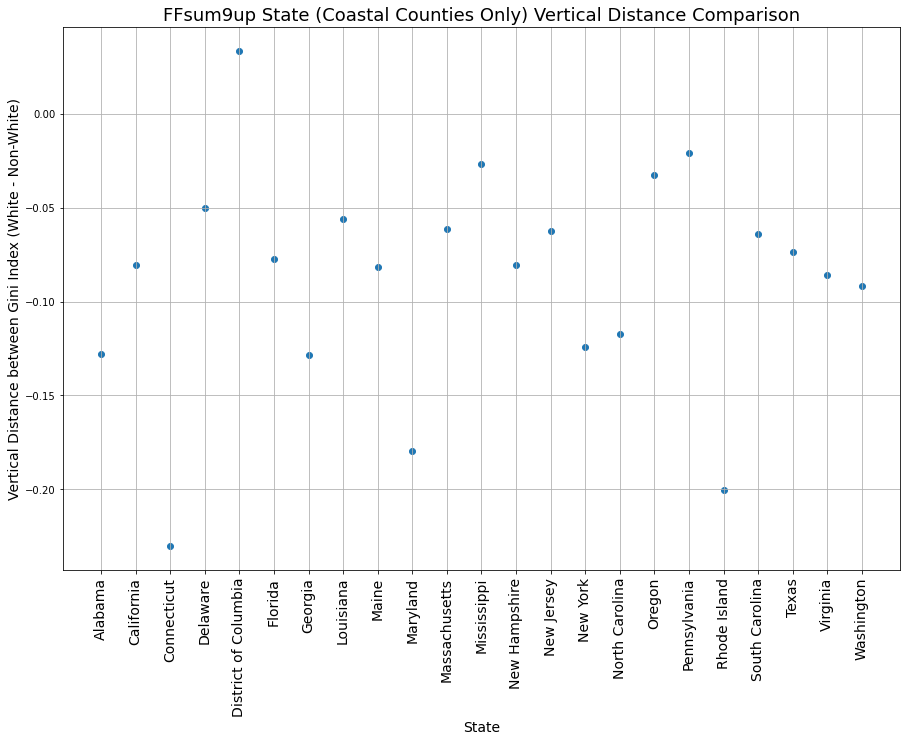

In [48]:
# state vertical distance comparison
coastalstates = ['Alabama', 'California', 'Connecticut', 'Delaware', 'District of Columbia', 
                 'Florida', 'Georgia', 'Louisiana', 'Maine', 'Maryland', 
                 'Massachusetts', 'Mississippi', 'New Hampshire', 'New Jersey', 'New York', 
                 'North Carolina', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 
                 'Texas', 'Virginia', 'Washington']

state = []
vd1_diff =[]
vd3_diff =[]
vd5_diff =[]
vd7_diff =[]
vd9_diff =[]
vd9diff_vd3diff =[]

for i in coastalstates:
    row_state_CC_FFsum = df_coastalstates_CC_FFsum_white_csv[df_coastalstates_CC_FFsum_white_csv['State'].str.endswith(i)]
    row_state_CC_FFsum3up = df_coastalstates_CC_FFsum3up_white_csv[df_coastalstates_CC_FFsum3up_white_csv['State'].str.endswith(i)]
    row_state_CC_FFsum5up = df_coastalstates_CC_FFsum5up_white_csv[df_coastalstates_CC_FFsum5up_white_csv['State'].str.endswith(i)]
    row_state_CC_FFsum7up = df_coastalstates_CC_FFsum7up_white_csv[df_coastalstates_CC_FFsum7up_white_csv['State'].str.endswith(i)]
    row_state_CC_FFsum9up = df_coastalstates_CC_FFsum9up_white_csv[df_coastalstates_CC_FFsum9up_white_csv['State'].str.endswith(i)]
    
    # difference in vertical distances is determined by VDdiff = (Gini of majority demo) - (Gini of non-majority demo)
    vd1_diff.append(row_state_CC_FFsum['Gini_white']-row_state_CC_FFsum['Gini_nonwhite'])
    vd3_diff.append(row_state_CC_FFsum3up['Gini_white']-row_state_CC_FFsum3up['Gini_nonwhite'])
    vd5_diff.append(row_state_CC_FFsum5up['Gini_white']-row_state_CC_FFsum5up['Gini_nonwhite'])
    vd7_diff.append(row_state_CC_FFsum7up['Gini_white']-row_state_CC_FFsum7up['Gini_nonwhite'])
    vd9_diff.append(row_state_CC_FFsum9up['Gini_white']-row_state_CC_FFsum9up['Gini_nonwhite'])
    vd9diff_vd3diff.append((row_state_CC_FFsum9up['Gini_white']-row_state_CC_FFsum9up['Gini_nonwhite'])/(row_state_CC_FFsum3up['Gini_white']-row_state_CC_FFsum3up['Gini_nonwhite']))
    
    state.append(i)

dictlist = {'State':state,'VDdiff_FFsum':vd1_diff,'VDdiff_FFsum3up':vd3_diff,'VDdiff_FFsum5up':vd5_diff,
            'VDdiff_FFsum7up':vd7_diff,'VDdiff_FFsum9up':vd9_diff,'VDdiffratio_9over3':vd9diff_vd3diff}
vddiff_coastalstates_CC_white_gini = pd.DataFrame(dictlist)
vddiff_coastalstates_CC_white_gini[['VDdiff_FFsum','VDdiff_FFsum3up','VDdiff_FFsum5up','VDdiff_FFsum7up','VDdiff_FFsum9up','VDdiffratio_9over3']] = vddiff_coastalstates_CC_white_gini[['VDdiff_FFsum','VDdiff_FFsum3up','VDdiff_FFsum5up','VDdiff_FFsum7up','VDdiff_FFsum9up','VDdiffratio_9over3']].astype('float64')
vddiff_coastalstates_CC_white_gini.to_csv('results/VertDistPlots/CoastalStates_CC/VDdiff_white.csv')

FFs = ['FFsum','FFsum3up','FFsum5up','FFsum7up','FFsum9up']

for i in FFs:
    fig, ax = plt.subplots(figsize=(15,10))
    
    ax.scatter(vddiff_coastalstates_CC_white_gini['State'],vddiff_coastalstates_CC_white_gini['VDdiff_'+i])
    
    ax.set_title(i+' State (Coastal Counties Only) Vertical Distance Comparison',fontsize=18)
    ax.set_xlabel('State',fontsize=14)
    ax.set_ylabel('Vertical Distance between Gini Index (White - Non-White)',fontsize=14)
    plt.xticks(rotation=90,fontsize=14)
    ax.grid(True)
    
    plt.savefig('results/VertDistPlots/CoastalStates_CC/'+i+'_white.png', dpi=300, bbox_inches='tight')

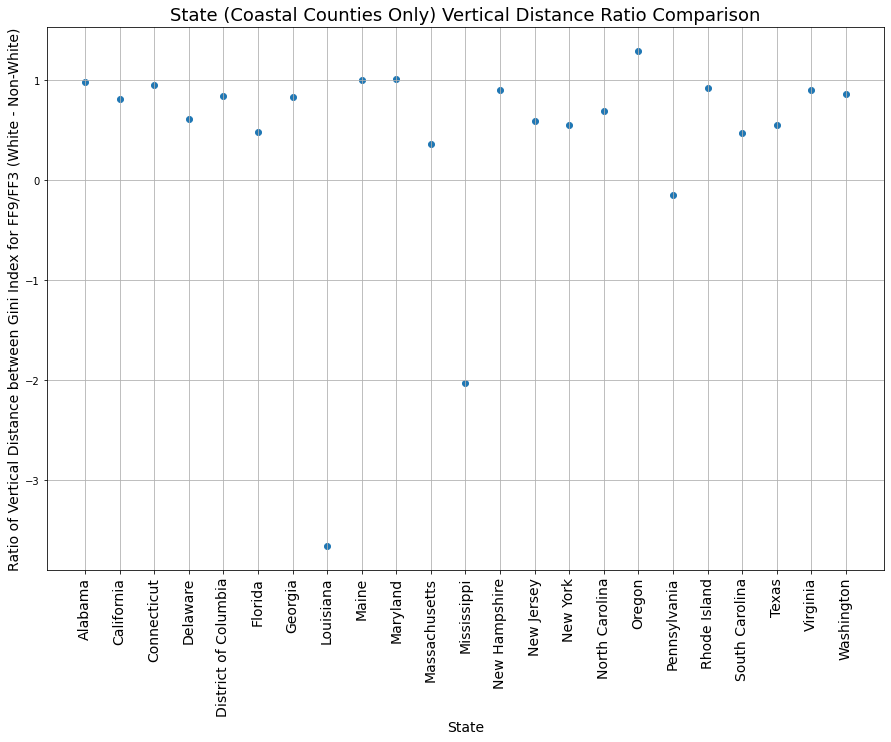

In [19]:
# state vertical distance ratio comparison
fig, ax = plt.subplots(figsize=(15,10))

ax.scatter(vddiff_coastalstates_CC_white_gini['State'],vddiff_coastalstates_CC_white_gini['VDdiffratio_9over3'])
    
ax.set_title('State (Coastal Counties Only) Vertical Distance Ratio Comparison',fontsize=18)
ax.set_xlabel('State',fontsize=14)
ax.set_ylabel('Ratio of Vertical Distance between Gini Index for FF9/FF3 (White - Non-White)',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
ax.grid(True)
    
plt.savefig('results/VertDistPlots/CoastalStates_CC/VDratio9over3_white.png', dpi=300, bbox_inches='tight')

## Coastal Counties

Coastal counties within states (including D.C.) in the contiguous U.S. according to NOAA Fisheries.

    https://www.fisheries.noaa.gov/inport/item/66112
    Includes AL and HI (NOT included in analysis)

### White

In [ ]:
# dataframe generation
df_coastalcounties_FFsum = read('data/tract_coastalcounties.csv','white','FFsum')
df_coastalcounties_FFsum3up = read('data/tract_coastalcounties.csv','white','FFsum3up')
df_coastalcounties_FFsum5up = read('data/tract_coastalcounties.csv','white','FFsum5up')
df_coastalcounties_FFsum7up = read('data/tract_coastalcounties.csv','white','FFsum7up')
df_coastalcounties_FFsum9up = read('data/tract_coastalcounties.csv','white','FFsum9up')

In [ ]:
# dataframe refinement
df_coastalcounties_FFsum_refined = refine(df_coastalcounties_FFsum)
df_coastalcounties_FFsum3up_refined = refine(df_coastalcounties_FFsum3up)
df_coastalcounties_FFsum5up_refined = refine(df_coastalcounties_FFsum5up)
df_coastalcounties_FFsum7up_refined = refine(df_coastalcounties_FFsum7up)
df_coastalcounties_FFsum9up_refined = refine(df_coastalcounties_FFsum9up)

In [ ]:
# lorenz curves
coastalcounties_FFsum = df_coastalcounties_FFsum_refined['COUNTY'].unique()
coastalcounties_FFsum3up = df_coastalcounties_FFsum3up_refined['COUNTY'].unique()
coastalcounties_FFsum5up = df_coastalcounties_FFsum5up_refined['COUNTY'].unique()
coastalcounties_FFsum7up = df_coastalcounties_FFsum7up_refined['COUNTY'].unique()
coastalcounties_FFsum9up = df_coastalcounties_FFsum9up_refined['COUNTY'].unique()

for i in coastalcounties_FFsum:
    df_coastalcounties_FFsum_county = county_dfs(df_coastalcounties_FFsum_refined,'white','FFsum',i)
    lorenz_curve(df_coastalcounties_FFsum_county[0],df_coastalcounties_FFsum_county[1],df_coastalcounties_FFsum_county[2],'white','FFsum','CoastalCounties',i)
for i in coastalcounties_FFsum3up:
    df_coastalcounties_FFsum3up_county = county_dfs(df_coastalcounties_FFsum3up_refined,'white','FFsum3up',i)
    lorenz_curve(df_coastalcounties_FFsum3up_county[0],df_coastalcounties_FFsum3up_county[1],df_coastalcounties_FFsum3up_county[2],'white','FFsum3up','CoastalCounties',i)
for i in coastalcounties_FFsum5up:
    df_coastalcounties_FFsum5up_county = county_dfs(df_coastalcounties_FFsum5up_refined,'white','FFsum5up',i)
    lorenz_curve(df_coastalcounties_FFsum5up_county[0],df_coastalcounties_FFsum5up_county[1],df_coastalcounties_FFsum5up_county[2],'white','FFsum5up','CoastalCounties',i)
for i in coastalcounties_FFsum7up:
    df_coastalcounties_FFsum7up_county = county_dfs(df_coastalcounties_FFsum7up_refined,'white','FFsum7up',i)
    lorenz_curve(df_coastalcounties_FFsum7up_county[0],df_coastalcounties_FFsum7up_county[1],df_coastalcounties_FFsum7up_county[2],'white','FFsum7up','CoastalCounties',i)
for i in coastalcounties_FFsum9up:
    df_coastalcounties_FFsum9up_county = county_dfs(df_coastalcounties_FFsum9up_refined,'white','FFsum9up',i)
    lorenz_curve(df_coastalcounties_FFsum9up_county[0],df_coastalcounties_FFsum9up_county[1],df_coastalcounties_FFsum9up_county[2],'white','FFsum9up','CoastalCounties',i)

In [ ]:
# csv generation
coastalcounties_FFsum = df_coastalcounties_FFsum_refined['COUNTY'].unique()
coastalcounties_FFsum3up = df_coastalcounties_FFsum3up_refined['COUNTY'].unique()
coastalcounties_FFsum5up = df_coastalcounties_FFsum5up_refined['COUNTY'].unique()
coastalcounties_FFsum7up = df_coastalcounties_FFsum7up_refined['COUNTY'].unique()
coastalcounties_FFsum9up = df_coastalcounties_FFsum9up_refined['COUNTY'].unique()

county_csvs(df_coastalcounties_FFsum_refined,coastalcounties_FFsum,'white','FFsum','CoastalCounties')
county_csvs(df_coastalcounties_FFsum3up_refined,coastalcounties_FFsum3up,'white','FFsum3up','CoastalCounties')
county_csvs(df_coastalcounties_FFsum5up_refined,coastalcounties_FFsum5up,'white','FFsum5up','CoastalCounties')
county_csvs(df_coastalcounties_FFsum7up_refined,coastalcounties_FFsum7up,'white','FFsum7up','CoastalCounties')
county_csvs(df_coastalcounties_FFsum9up_refined,coastalcounties_FFsum9up,'white','FFsum9up','CoastalCounties')
;

In [ ]:
# read csvs
df_coastalcounties_FFsum_white_csv = pd.read_csv('results/csvs/CoastalCounties/white_FFsum.csv')
df_coastalcounties_FFsum3up_white_csv = pd.read_csv('results/csvs/CoastalCounties/white_FFsum3up.csv')
df_coastalcounties_FFsum5up_white_csv = pd.read_csv('results/csvs/CoastalCounties/white_FFsum5up.csv')
df_coastalcounties_FFsum7up_white_csv = pd.read_csv('results/csvs/CoastalCounties/white_FFsum7up.csv')
df_coastalcounties_FFsum9up_white_csv = pd.read_csv('results/csvs/CoastalCounties/white_FFsum9up.csv')

In [ ]:
# comparison plot (Gini)
#df_coastalcounties_FFsum_white_csv = df_coastalcounties_FFsum_white_csv[df_coastalcounties_FFsum_white_csv['State'].str.endswith(XYZ)]
#df_coastalcounties_FFsum3up_white_csv = df_coastalcounties_FFsum3up_white_csv[df_coastalcounties_FFsum3up_white_csv['State'].str.endswith(XYZ)]
#df_coastalcounties_FFsum5up_white_csv = df_coastalcounties_FFsum5up_white_csv[df_coastalcounties_FFsum5up_white_csv['State'].str.endswith(XYZ)]
#df_coastalcounties_FFsum7up_white_csv = df_coastalcounties_FFsum7up_white_csv[df_coastalcounties_FFsum7up_white_csv['State'].str.endswith(XYZ)]
#df_coastalcounties_FFsum9up_white_csv = df_coastalcounties_FFsum9up_white_csv[df_coastalcounties_FFsum9up_white_csv['State'].str.endswith(XYZ)]
comparison_plot([df_coastalcounties_FFsum_white_csv['popwhite']/df_coastalcounties_FFsum_white_csv['poptotal'],df_coastalcounties_FFsum_white_csv['Gini_white']],
                [df_coastalcounties_FFsum_white_csv['popnonwhite']/df_coastalcounties_FFsum_white_csv['poptotal'], df_coastalcounties_FFsum_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum','CoastalCounties','gini_pd')
comparison_plot([df_coastalcounties_FFsum3up_white_csv['popwhite']/df_coastalcounties_FFsum3up_white_csv['poptotal'],df_coastalcounties_FFsum3up_white_csv['Gini_white']],
                [df_coastalcounties_FFsum3up_white_csv['popnonwhite']/df_coastalcounties_FFsum3up_white_csv['poptotal'], df_coastalcounties_FFsum3up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum3up','CoastalCounties','gini_pd')
comparison_plot([df_coastalcounties_FFsum5up_white_csv['popwhite']/df_coastalcounties_FFsum5up_white_csv['poptotal'],df_coastalcounties_FFsum5up_white_csv['Gini_white']],
                [df_coastalcounties_FFsum5up_white_csv['popnonwhite']/df_coastalcounties_FFsum5up_white_csv['poptotal'], df_coastalcounties_FFsum5up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum5up','CoastalCounties','gini_pd')
comparison_plot([df_coastalcounties_FFsum7up_white_csv['popwhite']/df_coastalcounties_FFsum7up_white_csv['poptotal'],df_coastalcounties_FFsum7up_white_csv['Gini_white']],
                [df_coastalcounties_FFsum7up_white_csv['popnonwhite']/df_coastalcounties_FFsum7up_white_csv['poptotal'], df_coastalcounties_FFsum7up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum7up','CoastalCounties','gini_pd')
comparison_plot([df_coastalcounties_FFsum9up_white_csv['popwhite']/df_coastalcounties_FFsum9up_white_csv['poptotal'],df_coastalcounties_FFsum9up_white_csv['Gini_white']],
                [df_coastalcounties_FFsum9up_white_csv['popnonwhite']/df_coastalcounties_FFsum9up_white_csv['poptotal'], df_coastalcounties_FFsum9up_white_csv['Gini_nonwhite']],
                'Population Fraction [%]','Gini Index','white','FFsum9up','CoastalCounties','gini_pd')
;

In [ ]:
# comparison plot for county at different FF
coastalcounties = df_coastalcounties_FFsum_refined['COUNTY'].unique()

vd_coastalcounties_white_gini = pd.DataFrame(columns=['County','VertDist_ave','VertDist_sum','VertDist_FFsum','VertDist_FFsum3up',
                                                    'VertDist_FFsum5up','VertDist_FFsum7up','VertDist_FFsum9up'])

for i in coastalcounties:
    row_county_FFsum = df_coastalcounties_FFsum_white_csv[df_coastalcounties_FFsum_white_csv['County'].str.endswith(i)]
    row_county_FFsum3up = df_coastalcounties_FFsum3up_white_csv[df_coastalcounties_FFsum3up_white_csv['County'].str.endswith(i)]
    row_county_FFsum5up = df_coastalcounties_FFsum5up_white_csv[df_coastalcounties_FFsum5up_white_csv['County'].str.endswith(i)]
    row_county_FFsum7up = df_coastalcounties_FFsum7up_white_csv[df_coastalcounties_FFsum7up_white_csv['County'].str.endswith(i)]
    row_county_FFsum9up = df_coastalcounties_FFsum9up_white_csv[df_coastalcounties_FFsum9up_white_csv['County'].str.endswith(i)]
    
    fig, ax = plt.subplots(figsize=(10,10))
    
    ax.scatter(row_county_FFsum['poptotal'],row_county_FFsum['Gini_white'], color='blue')
    ax.scatter(row_county_FFsum['poptotal'],row_county_FFsum['Gini_nonwhite'], color='orange')
    ax.scatter(row_county_FFsum3up['poptotal'],row_county_FFsum3up['Gini_white'], color='blue',marker='^')
    ax.scatter(row_county_FFsum3up['poptotal'],row_county_FFsum3up['Gini_nonwhite'], color='orange',marker='^')
    ax.scatter(row_county_FFsum5up['poptotal'],row_county_FFsum5up['Gini_white'], color='blue',marker='2')
    ax.scatter(row_county_FFsum5up['poptotal'],row_county_FFsum5up['Gini_nonwhite'], color='orange',marker='2')
    ax.scatter(row_county_FFsum7up['poptotal'],row_county_FFsum7up['Gini_white'], color='blue',marker='s')
    ax.scatter(row_county_FFsum7up['poptotal'],row_county_FFsum7up['Gini_nonwhite'], color='orange',marker='s')
    ax.scatter(row_county_FFsum9up['poptotal'],row_county_FFsum9up['Gini_white'], color='blue',marker='x')
    ax.scatter(row_county_FFsum9up['poptotal'],row_county_FFsum9up['Gini_nonwhite'], color='orange',marker='x')

    ax.set_title(i+' FF Comparison')
    ax.set_xlabel('Total Population')
    ax.set_ylabel('Gini Index')
    demo_patch = mpatches.Patch(color='blue', label='White')
    nondemo_patch = mpatches.Patch(color='orange', label='Nonwhite')
    FFsum_patch = mlines.Line2D([], [], color='black', marker='o', linestyle='None',markersize=10, label='FF 1 Up')
    FFsum3up_patch = mlines.Line2D([], [], color='black', marker='^', linestyle='None',markersize=10, label='FF 3 Up')
    FFsum5up_patch = mlines.Line2D([], [], color='black', marker='2', linestyle='None',markersize=10, label='FF 5 Up')
    FFsum7up_patch = mlines.Line2D([], [], color='black', marker='s', linestyle='None',markersize=10, label='FF 7 Up')
    FFsum9up_patch = mlines.Line2D([], [], color='black', marker='x', linestyle='None',markersize=10, label='FF 9 Up')
    ax.legend(handles=[demo_patch, nondemo_patch, FFsum_patch, FFsum3up_patch, FFsum5up_patch, FFsum7up_patch, FFsum9up_patch])
    ax.grid(True)

    vd1 = np.max(row_county_FFsum[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_county_FFsum[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd3 = np.max(row_county_FFsum3up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_county_FFsum3up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd5 = np.max(row_county_FFsum5up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_county_FFsum5up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd7 = np.max(row_county_FFsum7up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_county_FFsum7up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vd9 = np.max(row_county_FFsum9up[['Gini_white','Gini_nonwhite']].max(axis=1))-np.min(row_county_FFsum9up[['Gini_white','Gini_nonwhite']].min(axis=1))
    vdsum = vd1+vd3+vd5+vd7+vd9
    vdave = vdsum/5
    vd_coastalcounties_white_gini = vd_coastalcounties_white_gini.append({'County':i,'VertDist_ave':vdave,'VertDist_sum':vdsum,'VertDist_FFsum':vd1,'VertDist_FFsum3up':vd3,
                                                                      'VertDist_FFsum5up':vd5,'VertDist_FFsum7up':vd7,'VertDist_FFsum9up':vd9}, ignore_index=True)

    plt.savefig('results/GlobalComparisonPlots/CoastalCounties/'+i+'_FFComparison.png', dpi=300, bbox_inches='tight')
vd_coastalcounties_white_gini.to_csv('results/GlobalComparisonPlots/CoastalCounties/VerticalDistance')